# Introduction to CUSUM
Read chapter 2.2 from "Detection of Abrupt Changes: Theory and Application", I am not going to rewrite it.

# How the likelihood can be rewritten for different distributions

## Gaussian 

The distribution is:
$$p(x_i;\theta)=\frac{1}{\sqrt{2 \pi \sigma^2} }e^{\frac{(x_i - \mu)^2}{2 \sigma ^2}}$$
Then if the hypothesis are with the following parameters:
$$\theta_0 = \left[\mu,\sigma \right]$$
$$\theta_1 = \left[\mu+\delta,\sigma \right]$$
The log likelihood ratio can be simplified to:
$$LLR = \frac{\delta}{\sigma^2}\left( x_i - \left(\mu + \frac{\delta}{2}\right)\right)$$

## BiGaussian

The distribution is:
$$p(x_i;\theta)=\alpha \frac{1}{\sqrt{2 \pi {\sigma_1}^2} }e^{\frac{(x_i - \mu)^2}{2 {\sigma_1}^2}} + (1-\alpha) \frac{1}{\sqrt{2 \pi {\sigma_2}^2} }e^{\frac{(x_i - \mu)^2}{2 {\sigma_2}^2}}$$
Then if the hypothesis are with the following parameters:
$$\theta_0 = \left[\mu,\sigma_1,\sigma_2 ,\alpha \right]$$
$$\theta_1 = \left[\mu+\delta,\sigma_1,\sigma_2,\alpha \right]$$
The log likelihood cant be simplified.
$$LLR = \log{\frac{p(x_i;\theta_1)}{p(x_i;\theta_0)}}$$

## Gaussian + Laplacian

## Approx to bigaussian fast

$$  p(x_i;\theta)= K_{int} \left\{
        \begin{array}{ll}
            \alpha \frac{1}{\sqrt{2 \pi {\sigma_1}^2} }e^{-\frac{(x_i - \mu)^2}{2 {\sigma_1}^2}}  & \quad \lvert x-\mu \rvert \leq x_{cut} \\
            K_{cont} \frac{1}{\sqrt{2 \pi {\sigma_2}^2} } e^{-\frac{(x_i - \mu)^2}{2 {\sigma_2}^2}} & \quad \lvert x-\mu \rvert \geq x_{cut}
        \end{array}
        \right.$$
where:
$$x_{cut}: \alpha \frac{1}{\sqrt{2 \pi {\sigma_1}^2} }e^{\frac{{x_{cut}}^2}{2 {\sigma_1}^2}} = (1-\alpha) \frac{1}{\sqrt{2 \pi {\sigma_2}^2} }e^{\frac{{x_{cut}}^2}{2 {\sigma_2}^2}} \iff x_{cut}=\sqrt{\frac{2 {\sigma_1}^2 {\sigma_2}^2 }{{\sigma_2}^2-{\sigma_1}^2} ln\left(\frac{\alpha \sigma_2}{(1-\alpha) \sigma_1} \right) }$$
$$K_{cont}:K_{cont} \frac{1}{\sqrt{2 \pi {\sigma_2}^2} } e^{-\frac{{x_{cut}}^2}{2 {\sigma_2}^2}} =\alpha \frac{1}{\sqrt{2 \pi {\sigma_1}^2} }e^{-\frac{{x_{cut}}^2}{2 {\sigma_1}^2}} \iff K_{cont}= \alpha \frac{\sigma_2}{\sigma_1} e^{\frac{{x_{cut}}^2}{2}\frac{{\sigma_1}^2-{\sigma_2}^2}{{\sigma_1}^2 {\sigma_2}^2}}$$
$$K_{int}:  \int_{\inf}^{\inf} p(x_i;\theta) \,dx = 1  \iff K_{int}=\frac{1}{\alpha (1-2 \Phi (\frac{-x_{cut}}{\sigma_1}))+2 K_{cont} \Phi (\frac{-x_{cut}}{\sigma_2})}$$
        
Then we can express the LLR according to which zone we are:

$$LLR=\left\{
        \begin{array}{ll}
            \frac{\delta}{ {\sigma_2}^2} \left(x- \mu -  \frac{\delta}{2} \right)  & \quad x < \mu - x_c \\
            ln \left(\frac{K_{cont} \sigma_1}{\alpha \sigma_2} \right) + \frac{(x-\mu)^2}{2 {\sigma_1}^2} - \frac{(x-\mu-\delta)^2}{2 {\sigma_2}^2}  & \quad \mu - x_c < x < \mu + x_c \\
            \frac{\delta}{ {\sigma_2}^2} \left(x- \mu -  \frac{\delta}{2} \right)  & \quad \mu + x_c < x < \mu + \delta - x_c \\
            ln \left(\frac{\alpha \sigma_2}{K_{cont} \sigma_1} \right) + \frac{(x-\mu)^2}{2 {\sigma_2}^2} - \frac{(x-\mu-\delta)^2}{2 {\sigma_1}^2}  & \quad \mu + \delta - x_c < x < \mu + \delta + x_c \\
            \frac{\delta}{{\sigma_1}^2} \left(x- \mu -  \frac{\delta}{2} \right) & \quad \mu + \delta - x_c < x < \mu + x_c \\
            \frac{\delta}{{\sigma_2}^2} \left(x- \mu -  \frac{\delta}{2} \right) & \quad \mu + \delta + x_c < x
        \end{array}
        \right.$$
        
If we call $$K_{LLR}= ln \left(\frac{\alpha \sigma_2}{K_{cont} \sigma_1} \right) $$
It can be computed before running and save computation time.


# Analysis

In [1]:
from funcs_for_notebook import analyze_configuration,estimate_h_range_and_evaluate_for_all_types,estimate_ARL0,gen_bigaussian_noise ##Funcs useful for the notebook
from funcs_for_notebook import loop_config_through_hs,plot_loop_config_through_hs_output,analyze_configuration_v2,estimate_h_range_for_all_types_v2
from funcs_for_notebook import generate_synthetic_data,run_cusum,compute_results,plot_LLR_opt,simple_run_test,loop_config_through_hs,plot_loop_config_through_hs_output
#for the paper
from funcs_for_notebook import loop_config_through_hs_MSE_w_tol,plot_loop_MSE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Tests to see the functions working correctly

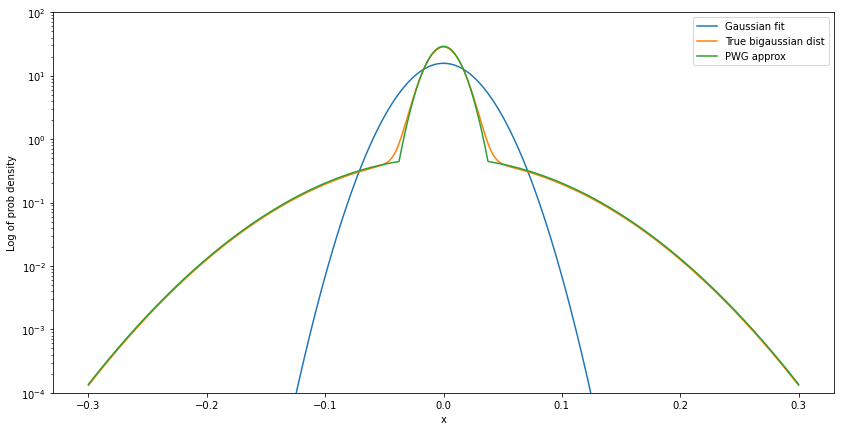

In this case is shown when the expected jump is before the breaking point


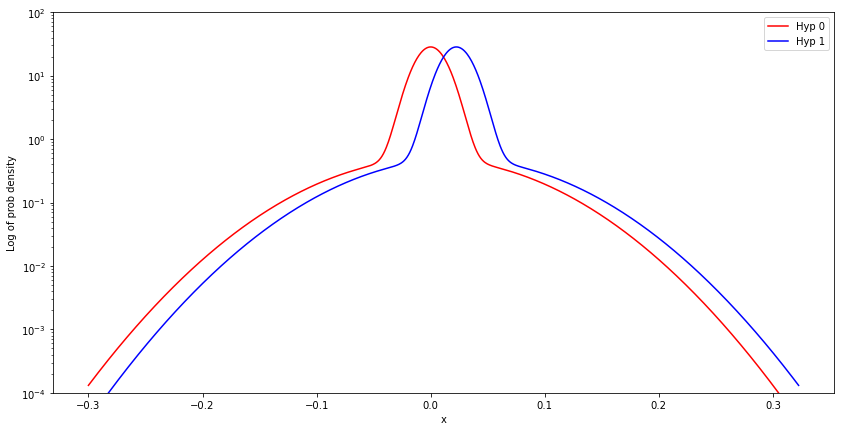

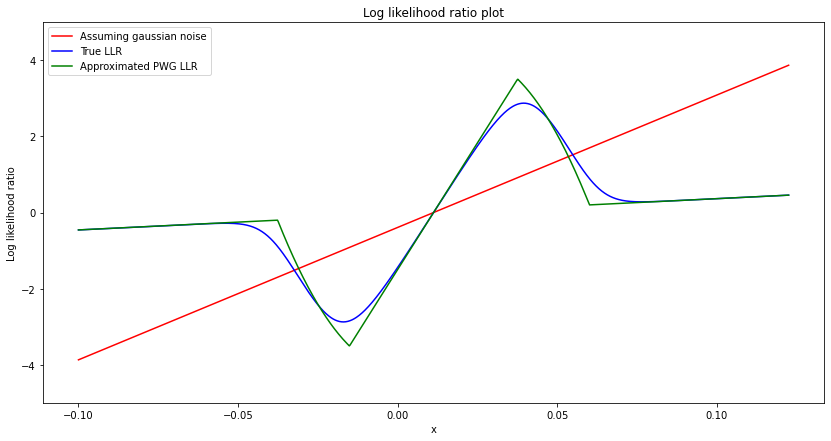

In this case is shown when the expected jump is after the breaking point


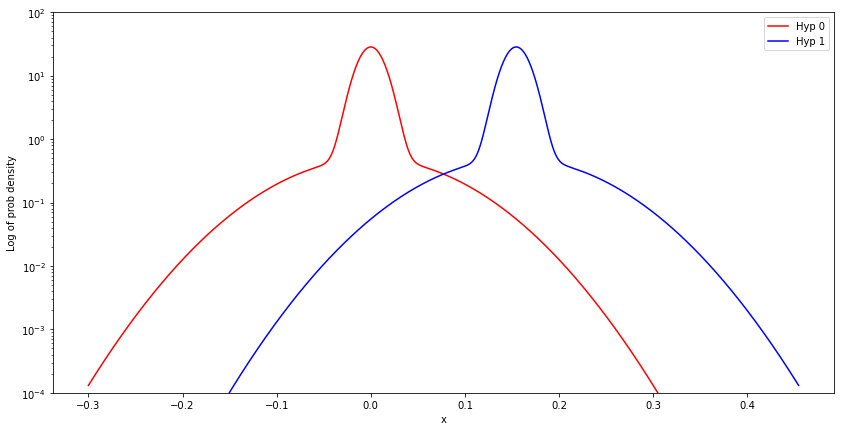

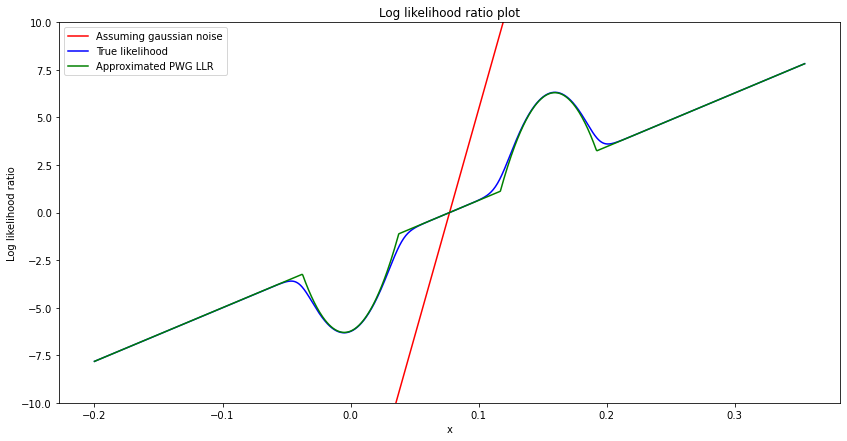

1606


In [3]:
from funcs_for_notebook import test_pdfs_and_fits,test_log_likelihoods,test_cusum,test_ARL_estimations
test_pdfs_and_fits();
test_log_likelihoods();
test_cusum();
test_ARL_estimations();

ARL0 and ARL1 comparison for the different methods, in noise conditions similar to the ones in the devices.

## Example on distributions with values of the fitting of devices
### Dev 17 Noise setup

In [18]:
mu=0;alpha=0.91;std=0.013;std2=0.074;  #Dev 17 of day 0709 setup.
mean_current=0.150;
delta= 0.15*mean_current

In [63]:
h=10; #To try different h values, so the ARL0 are around 50-500 for all configs.
ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type="Gaussian",tol=0.01)
print("ARL0:"+str(ARL0_mean_est)+" ARL1: " + str(ARL1_mean_est)+ " Time: " + str(ARL0_comp_time))

ARL0:91.77083333333333 ARL1: 5.946428571428571 Time: 3.5277563314138836e-06


In [28]:
h=6; #To try different h values, so the ARL0 are around 50-500 for all configs.
ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type="Gaussian",tol=0.01)
print("ARL0:"+str(ARL0_mean_est)+" ARL1: " + str(ARL1_mean_est)+ " Time: " + str(ARL0_comp_time))
#ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type="Bigaussian",tol=0.01)
#print("ARL0:"+str(ARL0_mean_est)+" ARL1: " + str(ARL1_mean_est)+ " Time: " + str(ARL0_comp_time))

ARL0:579.1238938053098 ARL1: 14.159090909090908 Time: 2.996026042377565e-06


In [29]:
n=10
h_values_map={"Gaussian":np.linspace(2,6,num=n),"Bigaussian":np.linspace(2.6,4.8,num=n),"PWG":np.linspace(3,5.3,num=n)}
tol=0.001;
index=0;
res_table=pd.DataFrame(columns = ['pdf type' , 'h', 'ARL0','ARL1','comp_time_per_sample_arl0','ARL0_std','ARL1_std']) 
for pdf_types in h_values_map:
    h_values=h_values_map[pdf_types];
    print("Starting with type " + pdf_types)
    for h in h_values:
        print(str(int(index%n)+1)+"/"+str(n))
        ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type=pdf_types,tol=tol)
        res_table.loc[index]=[pdf_types,h,ARL0_mean_est,ARL1_mean_est,ARL0_comp_time,ARL0_mean_std_est,ARL1_mean_std_est]
        index+=1;
res_table.to_csv("Dev17_ARL_Analysis") 

Starting with type Gaussian
1/10
2/10
3/10
4/10
5/10
6/10
7/10
8/10
9/10
10/10
Starting with type Bigaussian
1/10
2/10
3/10
4/10
5/10
6/10
7/10
8/10
9/10
10/10
Starting with type PWG
1/10
2/10
3/10
4/10
5/10
6/10
7/10
8/10
9/10
10/10


In [31]:
res_table

,pdf type,h,ARL0,ARL1,comp_time_per_sample_arl0,ARL0_std,ARL1_std
0,Gaussian,2.000000,57.368635,4.734446,0.000010,0.057314,0.004727
1,Gaussian,2.444444,75.500000,5.882149,0.000007,0.075436,0.005881
2,Gaussian,2.888889,87.555665,6.756567,0.000009,0.087428,0.006754
3,Gaussian,3.333333,112.937023,7.696691,0.000004,0.112910,0.007681
4,Gaussian,3.777778,161.615005,8.983633,0.000004,0.161590,0.008965
5,Gaussian,4.222222,203.607178,9.784240,0.000006,0.203425,0.009781
6,Gaussian,4.666667,263.555877,11.136622,0.000004,0.263256,0.011119
7,Gaussian,5.111111,344.339303,11.836935,0.000006,0.344267,0.011815
8,Gaussian,5.555556,491.974384,13.053016,0.000004,0.491844,0.013035
9,Gaussian,6.000000,613.596985,13.771536,0.000004,0.613359,0.013752


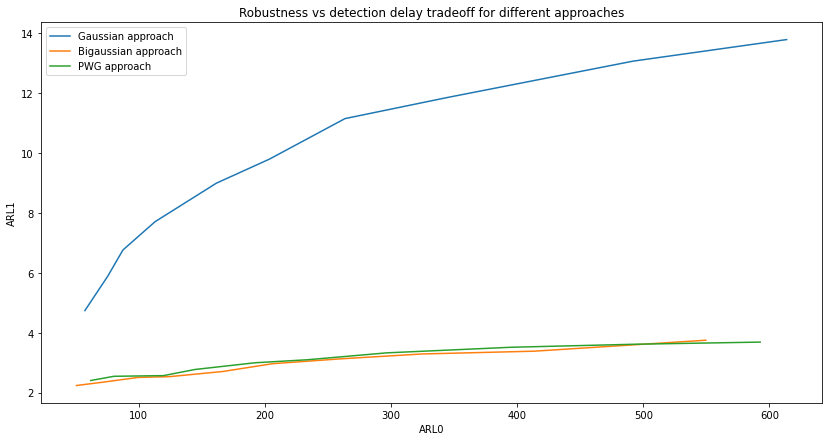

In [30]:
plt.figure(figsize=(14,7))
plt.plot(res_table[res_table["pdf type"]=="Gaussian"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="Gaussian"]["ARL1"].to_numpy(), label="Gaussian approach")
plt.plot(res_table[res_table["pdf type"]=="Bigaussian"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="Bigaussian"]["ARL1"].to_numpy(), label="Bigaussian approach")
plt.plot(res_table[res_table["pdf type"]=="PWG"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="PWG"]["ARL1"].to_numpy(), label="PWG approach")
plt.legend()
plt.xlabel("ARL0")
plt.ylabel("ARL1")
plt.title("Robustness vs detection delay tradeoff for different approaches")
plt.show()

Gaussian approach needs a higher h to have the same arl0, which forces its ARL1 to increase too. The bigaussian is optimal here, and we can see that the PWG approach has almos the same tradeoff as the optimal one but being much more efficient in the computing. It looks like it has a logarithm shape, so I plot it again with semilogx:

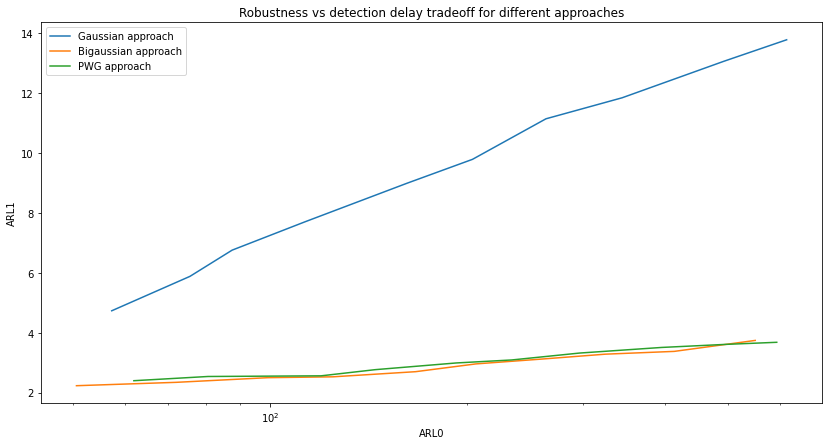

In [32]:
plt.figure(figsize=(14,7))
plt.semilogx(res_table[res_table["pdf type"]=="Gaussian"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="Gaussian"]["ARL1"].to_numpy(), label="Gaussian approach")
plt.semilogx(res_table[res_table["pdf type"]=="Bigaussian"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="Bigaussian"]["ARL1"].to_numpy(), label="Bigaussian approach")
plt.semilogx(res_table[res_table["pdf type"]=="PWG"]["ARL0"].to_numpy(), res_table[res_table["pdf type"]=="PWG"]["ARL1"].to_numpy(), label="PWG approach")
plt.legend()
plt.xlabel("ARL0")
plt.ylabel("ARL1")
plt.title("Robustness vs detection delay tradeoff for different approaches")
plt.show()

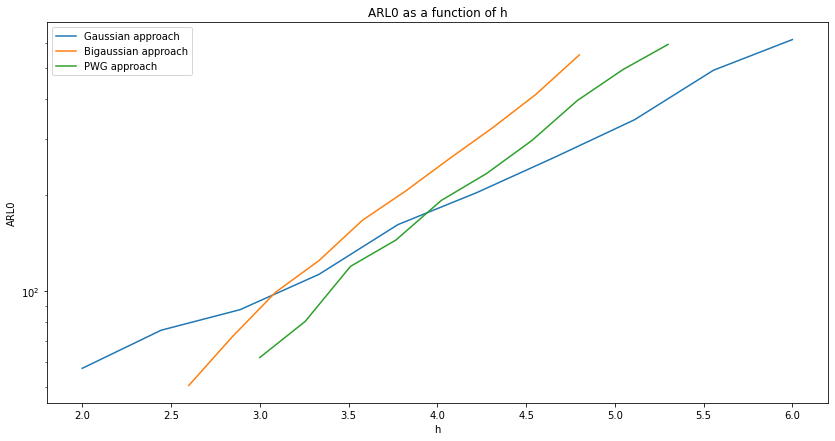

In [33]:
plt.figure(figsize=(14,7))
plt.semilogy(res_table[res_table["pdf type"]=="Gaussian"]["h"].to_numpy(), res_table[res_table["pdf type"]=="Gaussian"]["ARL0"].to_numpy(), label="Gaussian approach")
plt.semilogy(res_table[res_table["pdf type"]=="Bigaussian"]["h"].to_numpy(), res_table[res_table["pdf type"]=="Bigaussian"]["ARL0"].to_numpy(), label="Bigaussian approach")
plt.semilogy(res_table[res_table["pdf type"]=="PWG"]["h"].to_numpy(), res_table[res_table["pdf type"]=="PWG"]["ARL0"].to_numpy(), label="PWG approach")
plt.legend()
plt.xlabel("h")
plt.ylabel("ARL0")
plt.title("ARL0 as a function of h")
plt.show()

### Dev 45

In [79]:
mu=0;alpha=0.91;std=0.013;std2=0.074; #Fits for dev 45 on 0709 
mean_current=1.03; 
delta= 0.15*mean_current

In [85]:
h=70; #To try different h values, so the ARL0 are around 50-500 for all configs.
ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type="Gaussian",tol=0.01)
print("ARL0:"+str(ARL0_mean_est)+" ARL1: " + str(ARL1_mean_est)+ " Time: " + str(ARL0_comp_time))

ARL0:797.020202020202 ARL1: 1.0 Time: 1.709867315730847e-06


In [82]:
h=3.5; #To try different h values, so the ARL0 are around 50-500 for all configs.
ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(mu,std,std2,alpha,delta,h,pdf_type="Bigaussian",tol=0.01)
print("ARL0:"+str(ARL0_mean_est)+" ARL1: " + str(ARL1_mean_est)+ " Time: " + str(ARL0_comp_time))

ARL0:249.58415841584159 ARL1: 1.0 Time: 1.3792004832723912e-05


For this device the expected jumps are so high that having an acceptable ARL we obtain that always ARL1. This can be explained because delta is very high, so one sample with the mean changed already sets the trigger of the jump!

## More general analysis

In [3]:
std_1=1;mu=0;
alphas=[0.6,0.7,0.8,0.9];n_alpha=len(alphas);
std_2s=[3,6,9];n_std_2=len(std_2s);
deltas=[0.5,1,1.5,2,3];n_delta=len(deltas);
target_ARL0_range=[50,500]
tol=0.001;
index=0;

In [10]:

res_table=pd.DataFrame(columns = ['alpha','std2','delta','ARL0_min_big','ARL0_max_big','ARL0_min_g','ARL0_max_g','ARL0_min_pwg','ARL0_max_pwg','h_min_big','h_max_big','h_min_pwg','h_max_pwg','h_min_g','h_max_g']) 
for alpha in alphas:
    for std_2 in std_2s:
        for delta in deltas:
            h_lims_bigauss, h_lims_pwg, h_lims_gauss, ARL0_bigaussian, ARL0_gaussian, ARL0_pwg = estimate_h_range_and_evaluate_for_all_types(mu,std_1,std_2,alpha,delta,target_ARL0_range,verbose=1)
            res_table.loc[index]=[alpha,std_2,delta,ARL0_bigaussian[0],ARL0_bigaussian[1],ARL0_gaussian[0],ARL0_gaussian[1],
                                 ARL0_pwg[0],ARL0_pwg[1], h_lims_bigauss[0],h_lims_bigauss[1],h_lims_pwg[0],h_lims_pwg[1],h_lims_gauss[0],h_lims_gauss[1]]
            index+=1;        
res_table.to_csv("Simple Model H analysis") 

Base ARL0 found for bigaussian is :191.6 with H= 2.5
Hs range for bigaussian are: 1.095712545110812 - 3.106625897882558. R2 val is: 0.9973309354958885
Base ARL0 found for gaussian is :191.6 with H= 5.0
Hs range for Gaussian are: 1.9011981437736605 - 6.045572623494261. R2 val is: 0.9999580856333421
Bigaussian: Min ARL0 got: 33.12444444444444 And max ARL0:509.6012396694215
Gaussian: Min ARL0 got: 33.946100917431195 And max ARL0:494.8952590959206
PWG: Min ARL0 got: 29.71020856201976 And max ARL0:387.75646123260435
Base ARL0 found for bigaussian is :112.6 with H= 2.8000000000000003
Hs range for bigaussian are: 1.8926976831077977 - 3.9994557437111182. R2 val is: 0.9927879349378078
Base ARL0 found for gaussian is :112.6 with H= 5.6000000000000005
Hs range for Gaussian are: 3.2769882207013024 - 8.322175929892719. R2 val is: 0.9988600636636248
Bigaussian: Min ARL0 got: 43.111111111111114 And max ARL0:460.1524324324324
Gaussian: Min ARL0 got: 39.075535512965054 And max ARL0:473.19978858350953
P

In [11]:
res_table

,alpha,std2,delta,ARL0_min_big,ARL0_max_big,ARL0_min_g,ARL0_max_g,ARL0_min_pwg,ARL0_max_pwg,h_min_big,h_max_big,h_min_pwg,h_max_pwg,h_min_g,h_max_g
0,0.6,3.0,0.5,33.124444,509.601240,33.946101,494.895259,29.710209,387.756461,1.095713,3.106626,1.205284,3.417288,1.901198,6.045573
1,0.6,3.0,1.0,43.111111,460.152432,39.075536,473.199789,38.868063,374.842324,1.892698,3.999456,2.081967,4.399401,3.276988,8.322176
2,0.6,3.0,1.5,38.632871,508.940476,40.773737,539.776495,39.419780,491.663234,2.171707,4.563074,2.388878,5.019381,4.242072,10.183944
3,0.6,3.0,2.0,53.116109,424.891863,57.122081,417.788365,61.445720,529.000000,2.573122,4.563601,2.830434,5.019961,5.558246,10.776913
4,0.6,3.0,3.0,47.797225,999.151093,47.407143,471.848214,55.129884,2670.778437,2.308839,5.622015,2.539723,6.184217,6.356199,12.986059
5,0.6,6.0,0.5,38.535499,517.322884,3.324096,497.492503,34.560284,365.002053,1.150413,3.062069,1.265454,3.368276,0.048545,4.337227
6,0.6,6.0,1.0,44.249177,492.299901,29.460265,476.245972,38.766480,376.847071,1.837924,4.003298,2.021717,4.403628,1.864574,6.443985
7,0.6,6.0,1.5,51.711712,459.601547,38.000000,473.664241,49.529474,372.840565,2.280342,4.240176,2.508376,4.664194,2.834888,7.876372
8,0.6,6.0,2.0,50.357067,492.149893,36.595565,515.168724,50.044614,465.798419,2.374575,4.558841,2.612032,5.014725,3.396062,9.191682
9,0.6,6.0,3.0,52.664039,569.259506,49.319104,430.664596,62.693060,824.304703,2.437531,4.889022,2.681285,5.377924,5.128988,10.566460


## Generate ARL0 ARL1 Data for different configurations:

In [7]:
df = pd.read_csv ('Simple Model H analysis') ## Maybe I can improve the limits interpolating? Nope, didnt work as expected.
def interpolate_h_vals(ARL0_min,ARL0_max,h_min,h_max,ARL_target,hmin=1):
    m=(ARL0_max-ARL0_min)/(h_max-h_min);
    b=ARL0_max-m*h_max;
    h_target_min=(ARL_target[0]-b)/m;
    h_target_max=(ARL_target[1]-b)/m;
    h_target_min = h_target_min if h_target_min > hmin else hmin;
    return h_target_min,h_target_max
target_ARL0_range=[50,500]
noise_len=1e6;
tol=0.001;
for index, row in df.iterrows():
    h_target_min,h_target_max=interpolate_h_vals(row['ARL0_min_big'],row['ARL0_max_big'],row['h_min_big'],row['h_max_big'],target_ARL0_range);
    noise_generated=gen_bigaussian_noise(0,1,row['std2'],row['alpha'],int(noise_len))
    ARL0_bigaussian_min,_,_,_=estimate_ARL0(0,1,row['std2'],row['alpha'],row['delta'],h_target_min,noise_generated, "Bigaussian",tol,noise_len,minN=5)
    ARL0_bigaussian_max,_,_,_=estimate_ARL0(0,1,row['std2'],row['alpha'],row['delta'],h_target_max,noise_generated, "Bigaussian",tol,noise_len,minN=5)
    print("New limits: min " + str(ARL0_bigaussian_min) + " max " + str(ARL0_bigaussian_max)) 

New limits: min 38.517203107658155 max 484.2746913580247
New limits: min 49.463146314631466 max 585.5566137566137
New limits: min 43.131131131131134 max 509.30839231547014
New limits: min 49.73961499493414 max 681.1626694473409
New limits: min 51.92154811715481 max 156.53340635268347
New limits: min 42.91463414634146 max 451.8118393234672
New limits: min 48.07692307692308 max 537.0202839756593
New limits: min 50.54507337526206 max 501.9922480620155
New limits: min 50.717948717948715 max 537.472166998012
New limits: min 53.750254841997965 max 382.34662576687117
New limits: min 50.85281385281385 max 551.5163599182005
New limits: min 43.13601741022851 max 540.9588638589618
New limits: min 45.795983086680764 max 380.1957773512476
New limits: min 46.05601659751037 max 358.9560975609756
New limits: min 30.26372549019608 max 600.8821218074656


KeyboardInterrupt: 

In [9]:
df = pd.read_csv ('Simple Model H analysis') 
noise_len=1e6;
tol=0.001;
n=10;
out_table=pd.DataFrame(columns = ['alpha','std2','delta','pdf_type','h','ARL0','ARL1','CompTime']) 
pdf_types=["Gaussian","Bigaussian","PWG"];
out_table_idx=0;
def get_hs_for_pdf(row,pdf_types):
    if pdf_types=="Gaussian":
        hmin=row['h_min_g'];hmax=row['h_max_g'];
    elif pdf_types=="Bigaussian":
        hmin=row['h_min_big'];hmax=row['h_max_big'];
    elif pdf_types=="PWG":
        hmin=row['h_min_pwg'];hmax=row['h_max_pwg'];
    return hmin,hmax;
for index, row in df.iterrows():
    for pdf_type in pdf_types:
        hmin,hmax=get_hs_for_pdf(row,pdf_type)
        hs=np.linspace(hmin,hmax,num=n)
        for h in hs:
            print(out_table_idx)
            ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(0,1,row['std2'],row['alpha'],row['delta'],h,tol=tol,pdf_type=pdf_type)
            out_table.loc[out_table_idx]=[row['alpha'],row['std2'],row['delta'],pdf_type,h,ARL0_mean_est,ARL1_mean_est,ARL0_comp_time]
            out_table_idx+=1;
out_table.to_csv("ARL_Results_diff_confs.csv") 

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [10]:
df = pd.read_csv ('Simple Model H analysis') 
noise_len=1e6;
tol=0.0005;
n=20;
out_table=pd.DataFrame(columns = ['alpha','std2','delta','pdf_type','h','ARL0','ARL1','CompTime']) 
pdf_types=["Gaussian","Bigaussian","PWG"];
out_table_idx=0;
def get_hs_for_pdf(row,pdf_types):
    if pdf_types=="Gaussian":
        hmin=row['h_min_g'];hmax=row['h_max_g'];
    elif pdf_types=="Bigaussian":
        hmin=row['h_min_big'];hmax=row['h_max_big'];
    elif pdf_types=="PWG":
        hmin=row['h_min_pwg'];hmax=row['h_max_pwg'];
    return hmin,hmax;
for index, row in df.iterrows():
    for pdf_type in pdf_types:
        hmin,hmax=get_hs_for_pdf(row,pdf_type)
        hs=np.linspace(hmin,hmax,num=n)
        for h in hs:
            print(out_table_idx)
            ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration(0,1,row['std2'],row['alpha'],row['delta'],h,tol=tol,pdf_type=pdf_type)
            out_table.loc[out_table_idx]=[row['alpha'],row['std2'],row['delta'],pdf_type,h,ARL0_mean_est,ARL1_mean_est,ARL0_comp_time]
            out_table_idx+=1;
out_table.to_csv("ARL_Results_diff_confs_higher_res.csv") 

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

## Plotting the generated data

In [3]:
df = pd.read_csv ('ARL_Results_diff_confs.csv') ## Maybe I can improve the limits interpolating? Nope, didnt work as expected.
df

,Unnamed: 0,alpha,std2,delta,pdf_type,h,ARL0,ARL1,CompTime
0,0,0.6,3.0,0.5,Gaussian,1.901198,33.816524,13.409091,0.000006
1,1,0.6,3.0,0.5,Gaussian,2.361684,47.584101,17.594655,0.000005
2,2,0.6,3.0,0.5,Gaussian,2.822170,72.339795,21.373444,0.000003
3,3,0.6,3.0,0.5,Gaussian,3.282656,96.753059,25.846879,0.000003
4,4,0.6,3.0,0.5,Gaussian,3.743142,126.688113,30.303103,0.000003
...,...,...,...,...,...,...,...,...,...
1795,1795,0.9,9.0,3.0,PWG,4.479746,472.658954,1.483165,0.000004
1796,1796,0.9,9.0,3.0,PWG,4.775799,572.354502,1.538321,0.000003
1797,1797,0.9,9.0,3.0,PWG,5.071851,748.594845,1.582746,0.000004
1798,1798,0.9,9.0,3.0,PWG,5.367904,903.547985,1.630849,0.000004


In [5]:
def plot_ARL1_vs_ARL0(data_sub_table,title="Title"):
    plt.figure()
    plt.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL1"].to_numpy(), label="Gaussian approach")
    plt.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL1"].to_numpy(), label="Bigaussian approach")
    plt.semilogx(data_sub_table[data_sub_table["pdf_type"]=="PWG"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="PWG"]["ARL1"].to_numpy(), label="PWG approach")
    plt.legend()
    plt.xlabel("ARL0")
    plt.ylabel("ARL1")
    plt.grid()
    plt.title(title)
    plt.show()

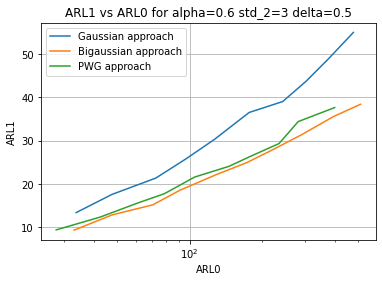

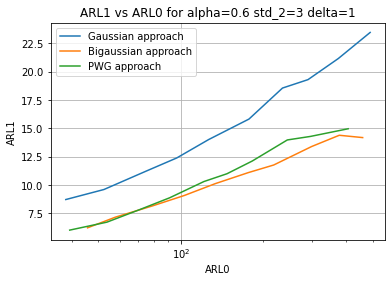

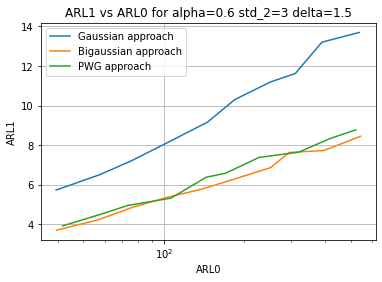

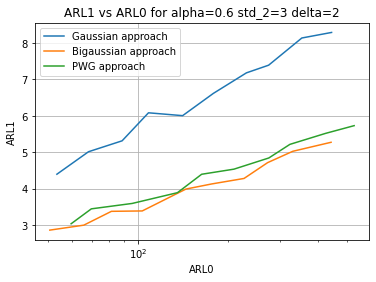

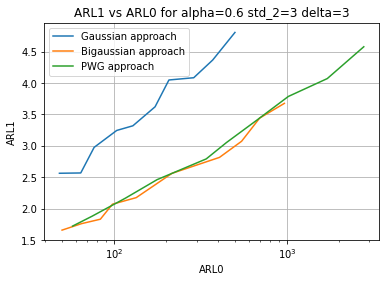

...

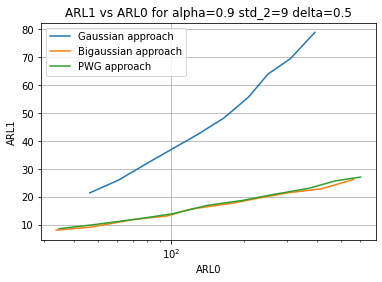

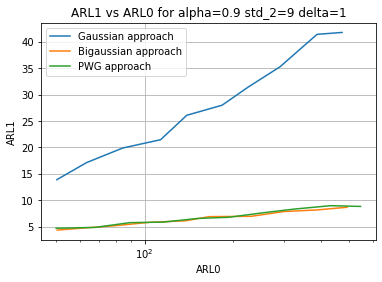

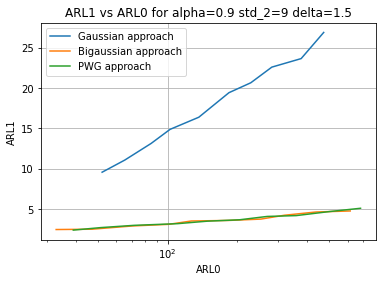

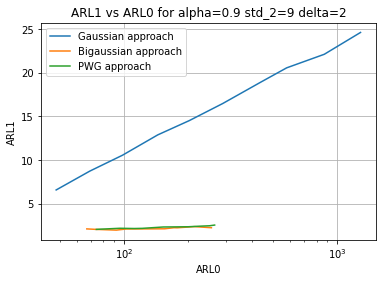

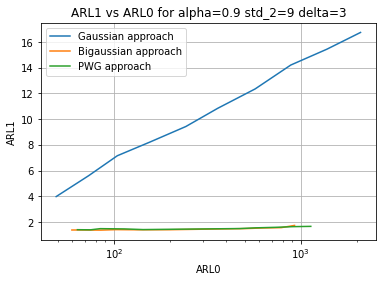

In [8]:
for alpha in alphas:
    for std_2 in std_2s:
        for delta in deltas:
            data_sub_table= df[(df["alpha"] == alpha) & (df["std2"] == std_2) & (df["delta"] == delta)]
            title= "ARL1 vs ARL0 for alpha="+ "{:.3g}".format(alpha) + " std_2="+ "{:.3g}".format(std_2) + " delta="+ "{:.3g}".format(delta);
            plot_ARL1_vs_ARL0(data_sub_table,title=title)

In [45]:
def plot_ARL1_vs_ARL0_in_axes(ax,data_sub_table,title="Title"):
    ax.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL1"].to_numpy(), label="Gaussian approach")
    ax.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL1"].to_numpy(), label="Bigaussian approach")
    ax.semilogx(data_sub_table[data_sub_table["pdf_type"]=="PWG"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="PWG"]["ARL1"].to_numpy(), label="PWG approach")
    ax.legend()
    ax.set_xlabel(r'$ARL_0 \; [samples]$')
    ax.set_ylabel(r'$ARL_1 \; [samples]$')
    ax.grid()
    ax.set_title(title)

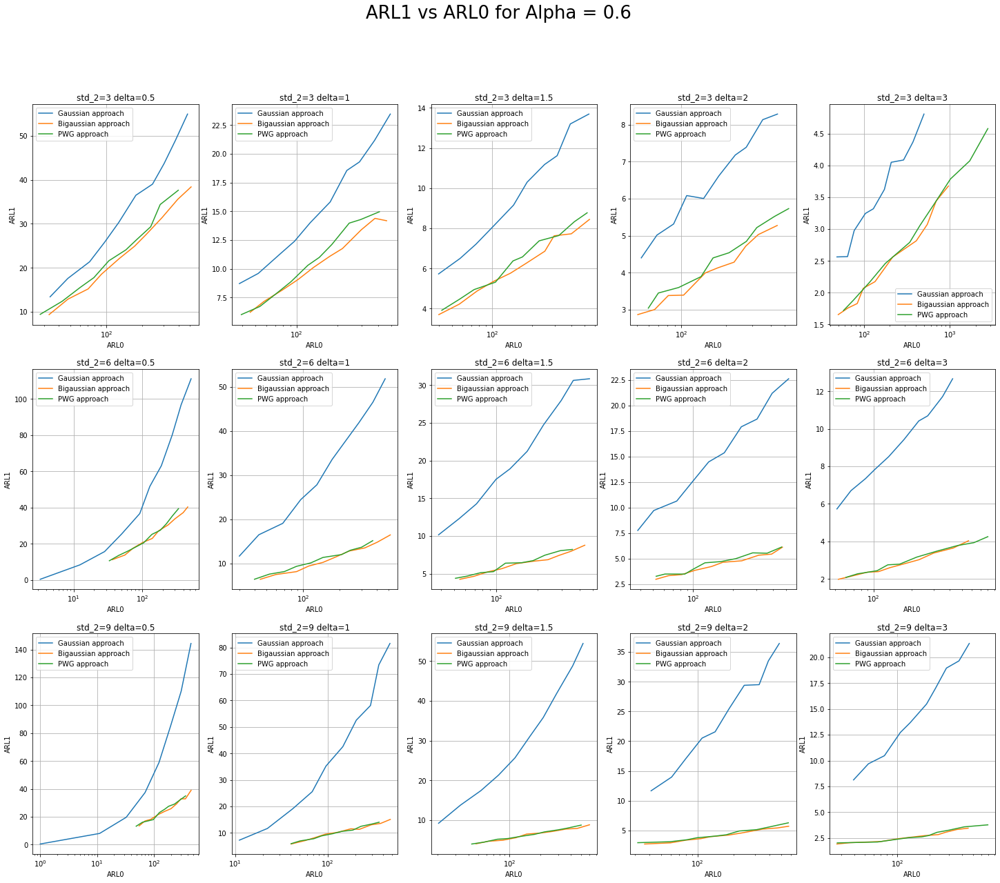

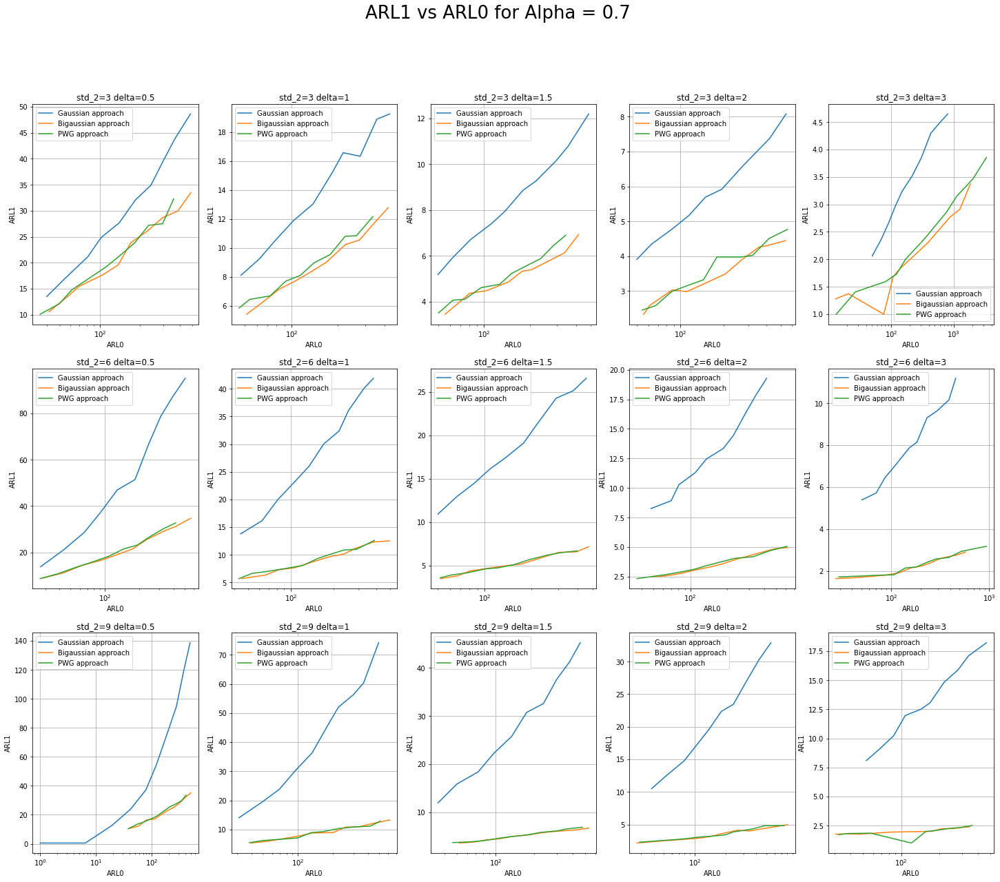

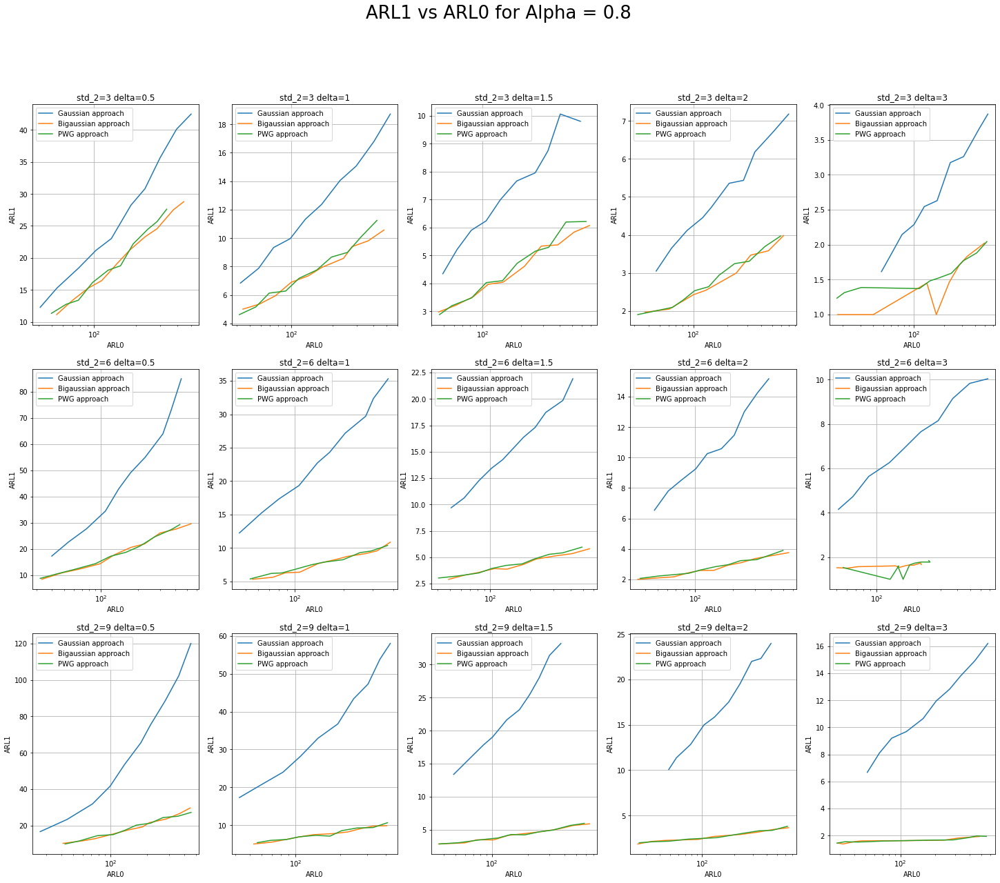

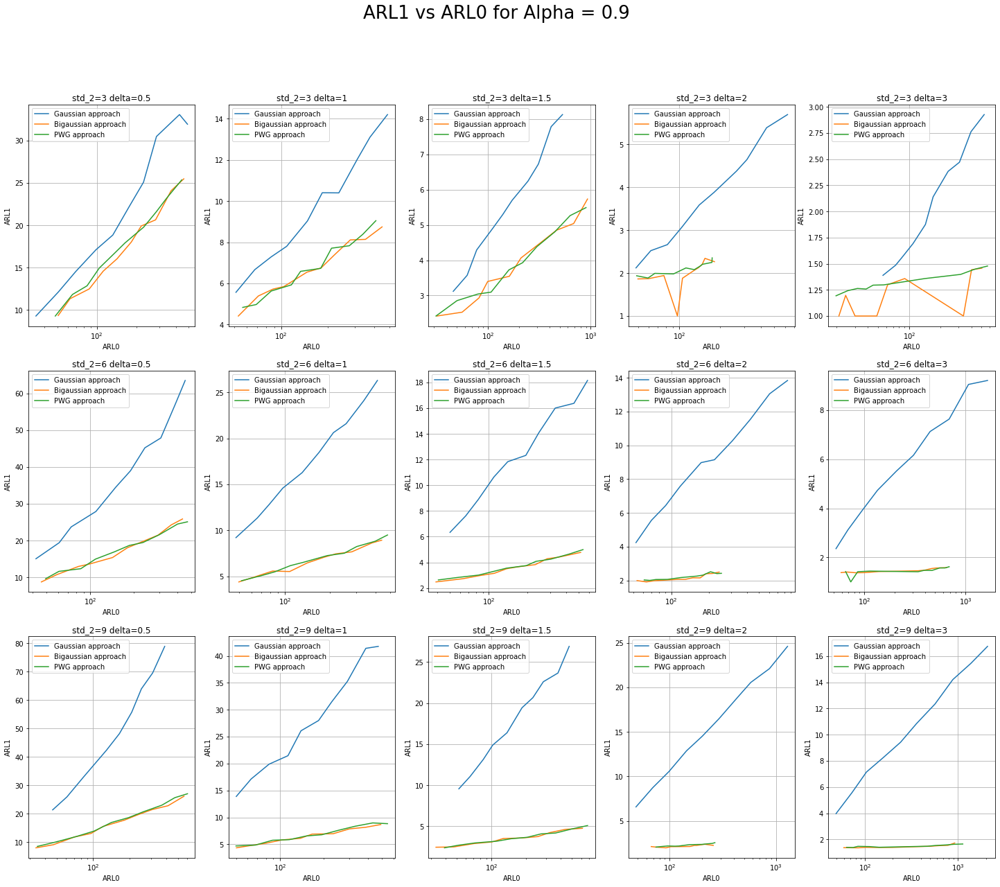

In [21]:
for alpha in alphas:
    print()
    fig, axs = plt.subplots(n_std_2, n_delta, figsize=(25,20))
    for std_2_idx in range(len(std_2s)):
        for delta_idx in range(len(deltas)):
            std_2=std_2s[std_2_idx];delta=deltas[delta_idx];
            data_sub_table= df[(df["alpha"] == alpha) & (df["std2"] == std_2) & (df["delta"] == delta)]
            title= "std_2="+ "{:.3g}".format(std_2) + " delta="+ "{:.3g}".format(delta);
            plot_ARL1_vs_ARL0_in_axes(axs[std_2_idx,delta_idx],data_sub_table,title=title)
    fig.suptitle("ARL1 vs ARL0 for Alpha = " + "{:.3g}".format(alpha), fontsize=26)
    plt.show()

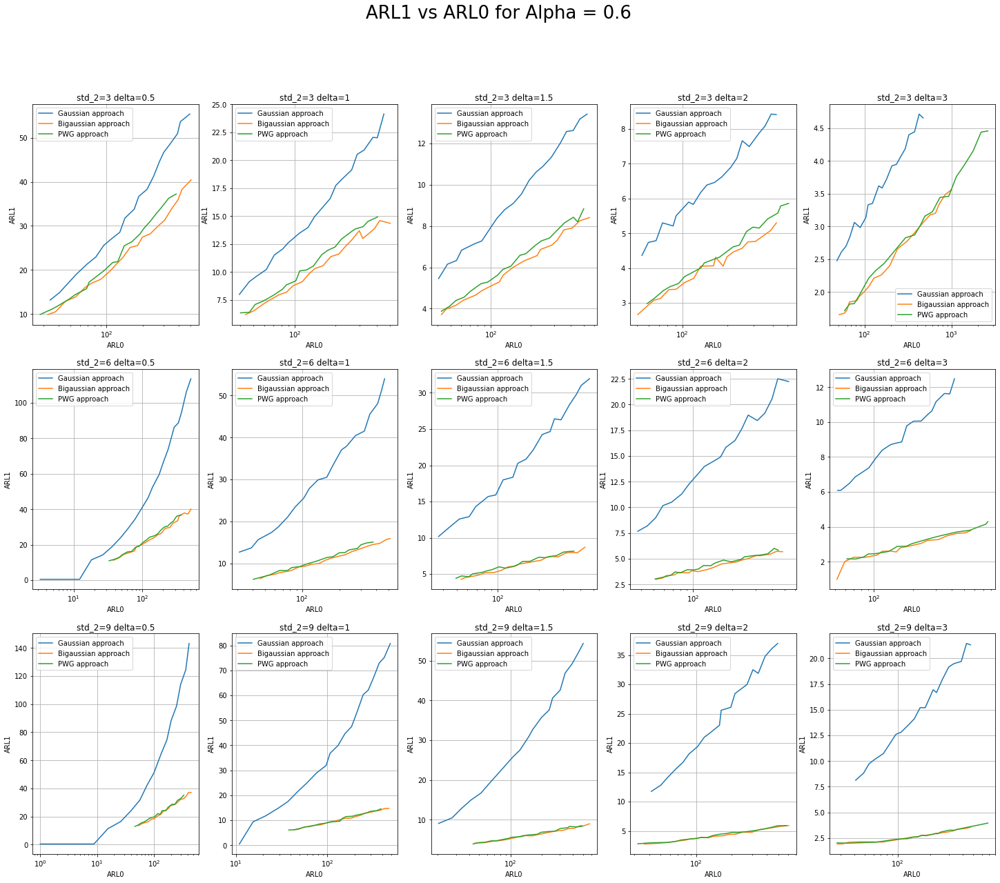

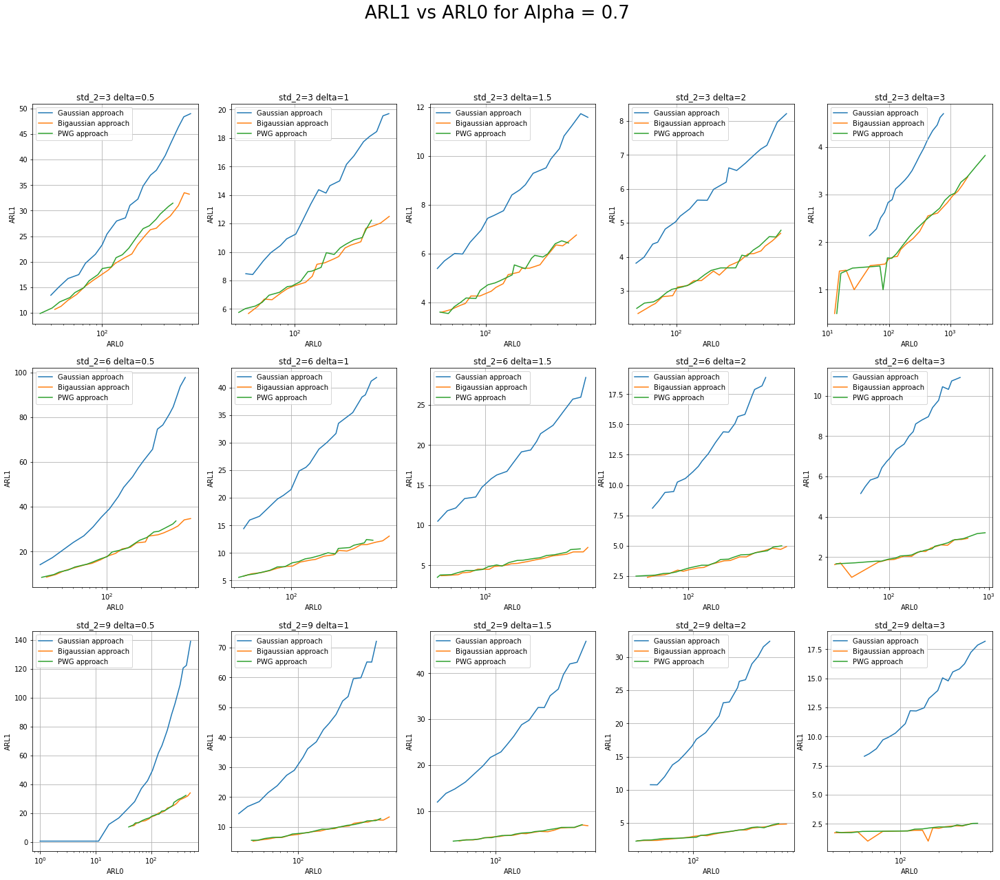

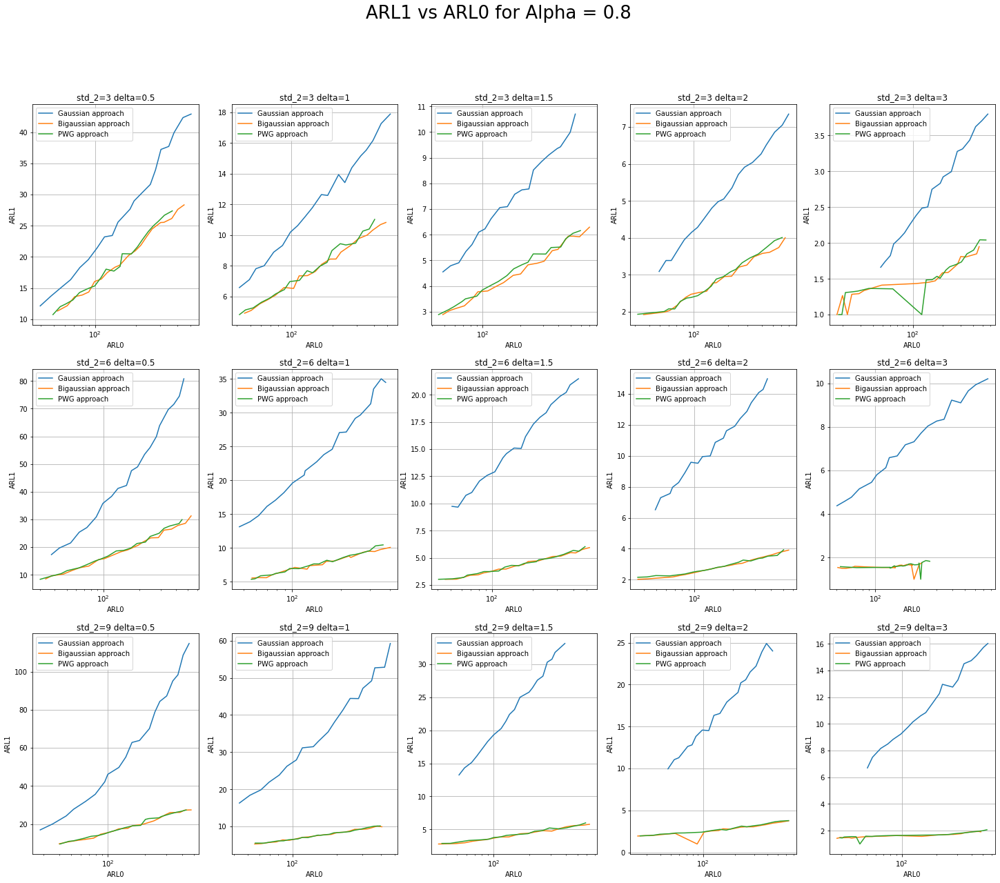

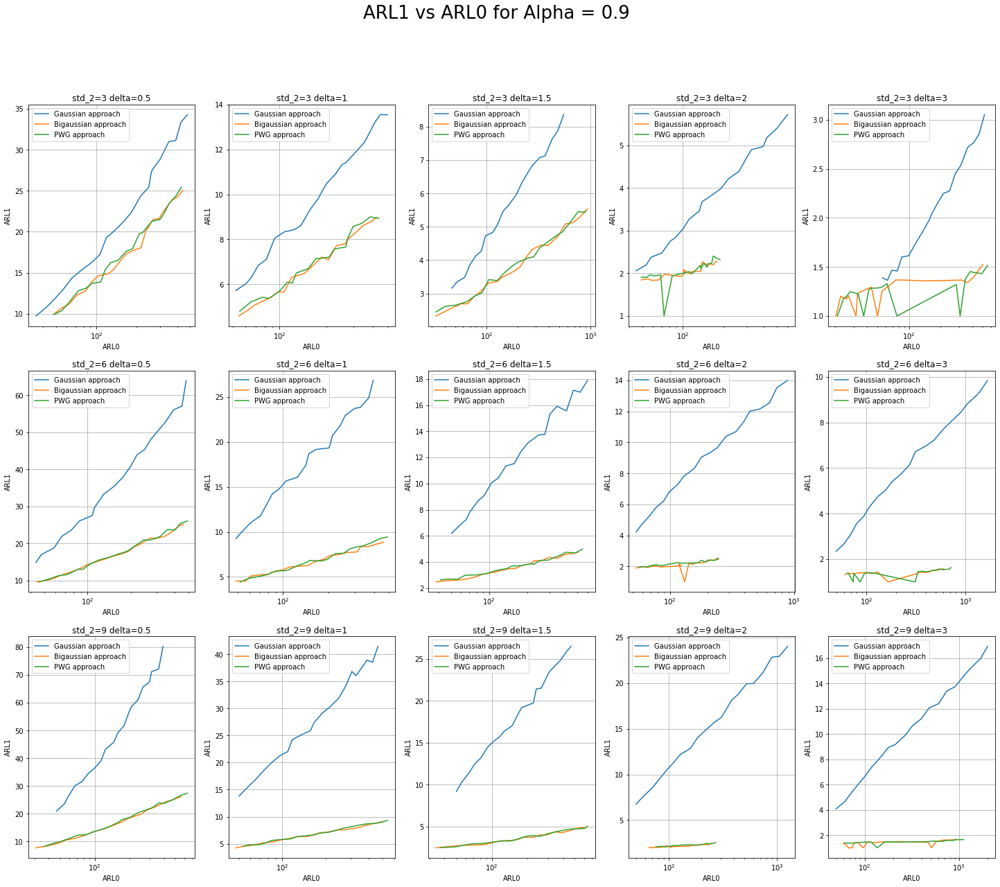

In [22]:
df_high_res=pd.read_csv ('ARL_Results_diff_confs_higher_res.csv')
for alpha in alphas:
    print()
    fig, axs = plt.subplots(n_std_2, n_delta, figsize=(25,20))
    for std_2_idx in range(len(std_2s)):
        for delta_idx in range(len(deltas)):
            std_2=std_2s[std_2_idx];delta=deltas[delta_idx];
            data_sub_table= df_high_res[(df_high_res["alpha"] == alpha) & (df_high_res["std2"] == std_2) & (df_high_res["delta"] == delta)]
            title= "std_2="+ "{:.3g}".format(std_2) + " delta="+ "{:.3g}".format(delta);
            plot_ARL1_vs_ARL0_in_axes(axs[std_2_idx,delta_idx],data_sub_table,title=title)
    fig.suptitle("ARL1 vs ARL0 for Alpha = " + "{:.3g}".format(alpha), fontsize=26)
    plt.show()

In [6]:
def fit_ARL_to_pol_logx(ARL0,ARL1,ARL0_range):
    idxs=np.logical_and(ARL0>ARL0_range[0],ARL0<ARL0_range[1]);
    return np.poly1d(np.polyfit(np.log10(ARL0[idxs]), ARL1[idxs], 2));
def get_ARL1_ARL0_ratio(data_sub_table,res=1):
    ARL0_range=[50,500];
    ARL0_gauss=data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL0"].to_numpy();
    ARL0_bigauss=data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL0"].to_numpy();
    gauss_pol_fit=fit_ARL_to_pol_logx(ARL0_gauss,data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL1"].to_numpy(),ARL0_range);
    bigauss_pol_fit=fit_ARL_to_pol_logx(ARL0_bigauss,data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL1"].to_numpy(),ARL0_range);
    min_ARL0=np.floor(np.max((np.min(ARL0_gauss),np.min(ARL0_bigauss),ARL0_range[0])))
    max_ARL0=np.floor(np.min((np.max(ARL0_gauss),np.max(ARL0_bigauss),ARL0_range[1])))+1 #The ranges of the ARLs to evalueate:
    ARL0_vals=np.arange(min_ARL0,max_ARL0);
    gauss_fit_ARL1=[gauss_pol_fit(np.log10(i)) for i in ARL0_vals]
    bigauss_fit_ARL1=[bigauss_pol_fit(np.log10(i)) for i in ARL0_vals]
    return ARL0_vals,gauss_fit_ARL1,bigauss_fit_ARL1

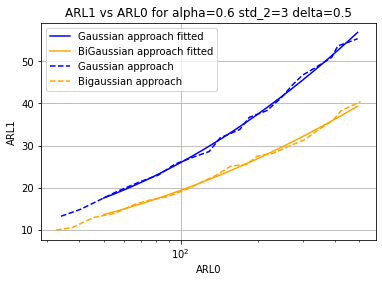

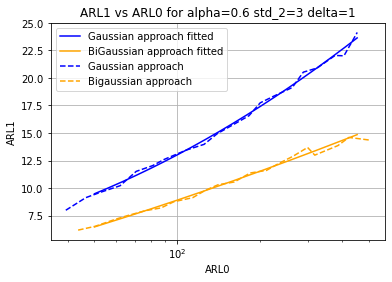

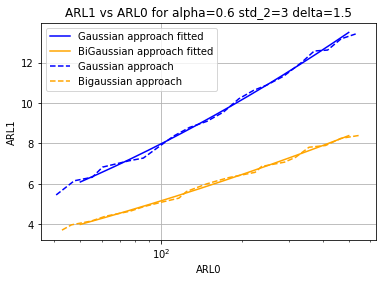

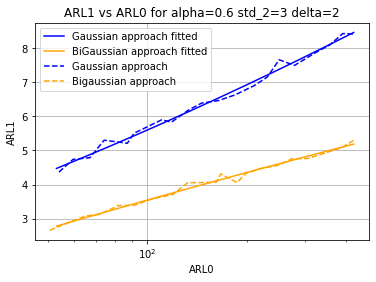

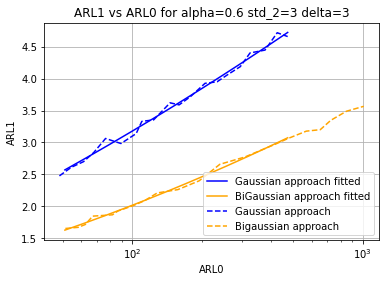

...

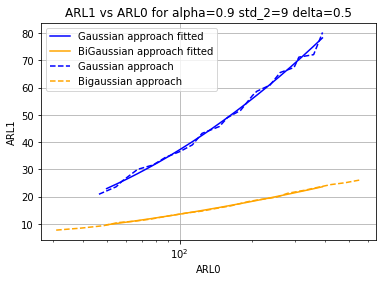

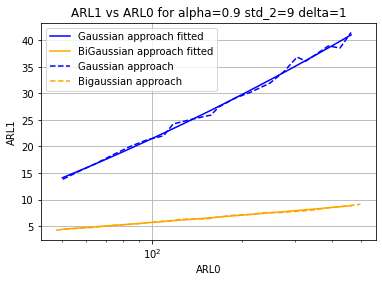

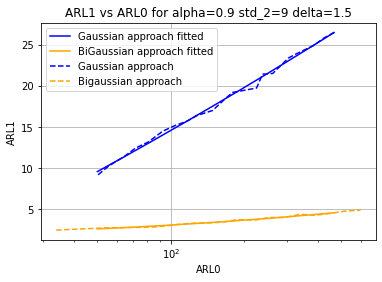

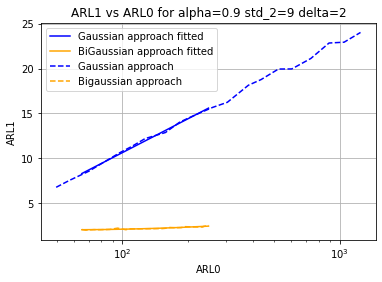

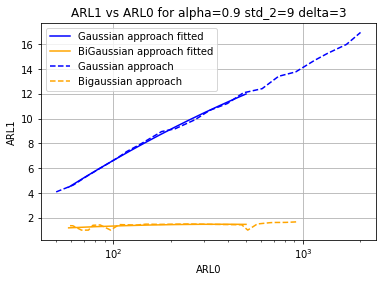

In [7]:
df=pd.read_csv ('ARL_Results_diff_confs_higher_res.csv') 
for alpha in alphas:
    for std_2 in std_2s:
        for delta in deltas:##To see that the fitting is working
            data_sub_table= df[(df["alpha"] == alpha) & (df["std2"] == std_2) & (df["delta"] == delta)]
            title= "ARL1 vs ARL0 for alpha="+ "{:.3g}".format(alpha) + " std_2="+ "{:.3g}".format(std_2) + " delta="+ "{:.3g}".format(delta);
            ARL0_vals,gauss_fit_ARL1,bigauss_fit_ARL1=get_ARL1_ARL0_ratio(data_sub_table,res=1);
            plt.figure()
            plt.semilogx(ARL0_vals, gauss_fit_ARL1, label="Gaussian approach fitted", color="blue")
            plt.semilogx(ARL0_vals, bigauss_fit_ARL1, label="BiGaussian approach fitted", color="orange")
            plt.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Gaussian"]["ARL1"].to_numpy(), label="Gaussian approach", color="blue",linestyle="--")
            plt.semilogx(data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL0"].to_numpy(), data_sub_table[data_sub_table["pdf_type"]=="Bigaussian"]["ARL1"].to_numpy(), label="Bigaussian approach", color="orange",linestyle="--")
            plt.legend()
            plt.xlabel("ARL0")
            plt.ylabel("ARL1")
            plt.grid()
            plt.title(title)
            plt.show()

In [10]:
def plot_ARL1_vs_ARL0_in_axes(ax,deltas,ARL0_list,rel_list,title="Title",cmap_min=1,cmap_max=2):
    ARL0_range=[50,500];
    ARL0_edges=np.arange(ARL0_range[0]-1,ARL0_range[1]+1)+0.5
    ARL0_values_plot=np.arange(ARL0_range[0],ARL0_range[1]+1) #x ticks to use in the colormesh
    delta_edges=[0.25,0.75,1.25,1.75,2.5,3.5]; 
    rel_values=np.zeros((len(deltas),len(ARL0_values_plot))) #The color values.
    for i in range(len(rel_list)):
        rel_values[i,:]=np.concatenate((np.zeros((1,int(ARL0_list[i][0]-ARL0_range[0]))),np.reshape(rel_list[i],(1,len(rel_list[i]))),np.zeros((1,int(ARL0_range[-1]-ARL0_list[i][-1])))),axis=1) #Fills  with 0 the values not calculated
    X, Y = np.meshgrid(ARL0_edges, delta_edges)
    cmap=plt.cm.OrRd
    im=ax.pcolormesh(X, Y, rel_values,cmap=cmap, vmin=cmap_min, vmax=cmap_max)
    ax.set_xlabel("ARL0")
    ax.set_ylabel("Delta")
    ax.set_title(title)
    return im
    #ax.colorbar()

Text(0.5, 0.98, 'ARL1(Gaussian)/ARL1(Bigaussian) for different configurations')

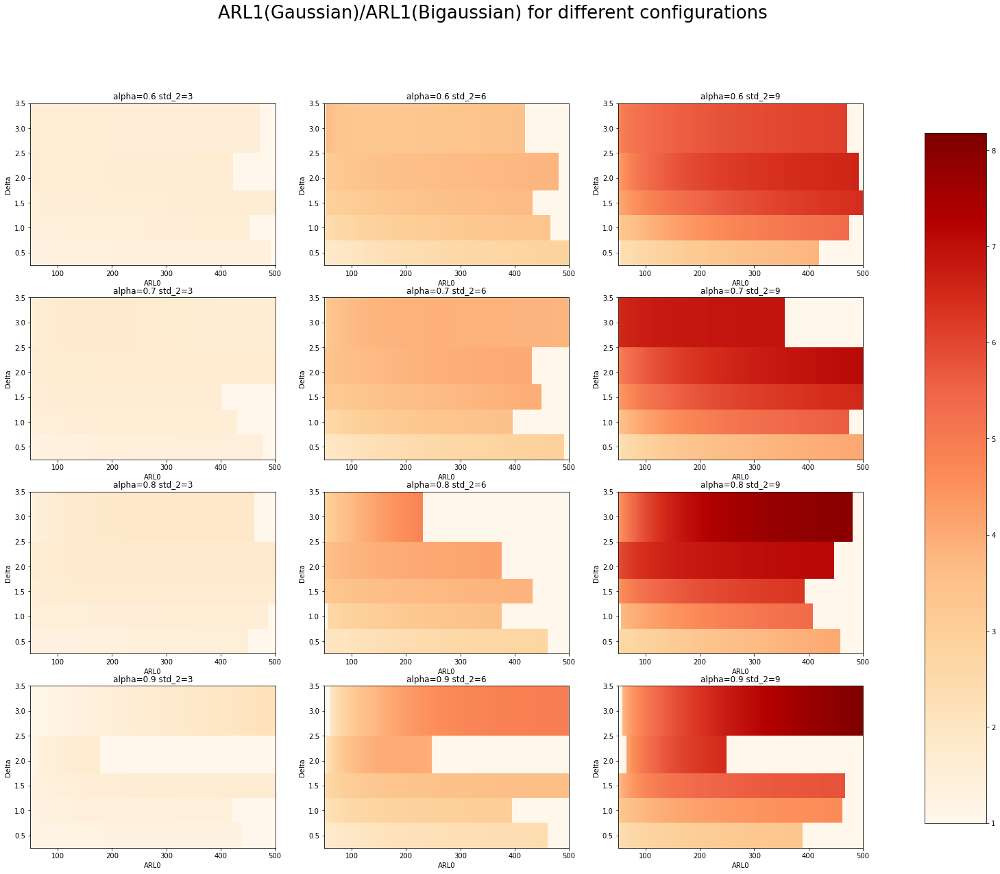

In [12]:
fig, axs = plt.subplots(n_alpha, n_std_2, figsize=(25,20))
for alpha_idx in range(n_alpha):
    for std_2_idx in range(n_std_2):
        alpha=alphas[alpha_idx];std_2=std_2s[std_2_idx];
        rel_lists=[];
        for delta in deltas:
            data_sub_table= df[(df["alpha"] == alpha) & (df["std2"] == std_2) & (df["delta"] == delta)]
            ARL0_vals,gauss_fit_ARL1,bigauss_fit_ARL1=get_ARL1_ARL0_ratio(data_sub_table,res=1);
            ARL0_vals_list.append(ARL0_vals);
            rel_lists.append(np.divide(gauss_fit_ARL1,bigauss_fit_ARL1))
max_rel= np.max([np.max(i) for i in rel_lists]);
for alpha_idx in range(n_alpha):
    for std_2_idx in range(n_std_2):
        alpha=alphas[alpha_idx];std_2=std_2s[std_2_idx];
        ARL0_vals_list=[];rel_lists=[];
        title="alpha="+ "{:.3g}".format(alpha) + " std_2="+ "{:.3g}".format(std_2);
        for delta in deltas:##To see that the fitting is working
            data_sub_table= df[(df["alpha"] == alpha) & (df["std2"] == std_2) & (df["delta"] == delta)]
            ARL0_vals,gauss_fit_ARL1,bigauss_fit_ARL1=get_ARL1_ARL0_ratio(data_sub_table,res=1);
            ARL0_vals_list.append(ARL0_vals);
            rel_lists.append(np.divide(gauss_fit_ARL1,bigauss_fit_ARL1))
            #print(rel_lists)
        im=plot_ARL1_vs_ARL0_in_axes(axs[alpha_idx,std_2_idx],deltas,ARL0_vals_list,rel_lists,title=title,cmap_max=max_rel)
        #fig.colorbar(im,ax=axs[alpha_idx,std_2_idx])
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax)
fig.suptitle("ARL1(Gaussian)/ARL1(Bigaussian) for different configurations", fontsize=26)

# Working with real data

In [2]:
#Imports the folder of the pwctools
import sys
import os
func_path="C:/Users/JK-WORK/Documents/MST/Event-analysis/Data analysis/Useful_funcs_and_classes"
if not any(os.path.normcase(sp) == os.path.normcase(func_path) for sp in sys.path):
    sys.path.append(func_path) ##Adds path to the python path to fi

In [3]:
from Nanoelectrode_database_handler import Nanoelectrode_database_handler ##Nanoelectrode libs
from Nanoelectrode_state_analyzer_cusum import Nanoelectrode_state_analyzer_cusum
from Nanoelectrode_noise_analyzer import Nanoelectrode_noise_analyzer

In [5]:
meas_folder="Z:/"
db_07_09=Nanoelectrode_database_handler(meas_folder+"20210709")
nsac_07_09=Nanoelectrode_state_analyzer_cusum(db_07_09)

Using only tunneling devices


## Dev 14

In [59]:
nsac_07_09.set_dev_and_voltage(14,500)
nsac_07_09.plot_whole_trace();

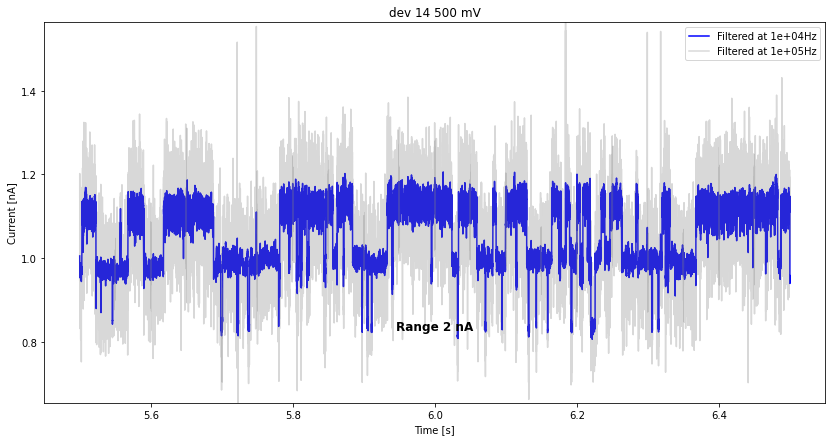

In [60]:
%matplotlib inline
nsac_07_09.set_test_sub_signal(5.5,6.5);

C:/Users/JK-WORK/Documents/MST/Event-analysis/Data analysis/Useful_funcs_and_classes\Hist_with_fits.py:35: RuntimeWarning: divide by zero encountered in log10
  y=np.log10(n);


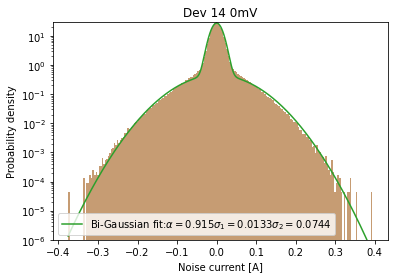

Total std @0mV: 0.024784


In [15]:
snoa0709=Nanoelectrode_noise_analyzer(db_07_09)
alpha,std,std2=snoa0709.plot_hist(14,voltage=0,fit="Bigaussian_log",title="Dev 14 0mV",bins=200,normalized=False)
params=(std, std2, alpha);
print("Total std @0mV: " + str(db_07_09.get_pulse_information_dev(14,'std',0)))

In [16]:
np.sqrt(alpha*(std)**2 + (1-alpha) * std2**2)

0.025151080896250715

In [65]:
delta_est=0.1; sensitivity=200;
%matplotlib qt
nsac_07_09.change_cusum_func("PWG")
t,signal_to_use_1,PWC_signal_1,std_val=nsac_07_09.apply_cusum(delta_est,sensitivity,params=params,whole_trace=False,plot=True,detrend=False);
std_val

0.04225521096011963

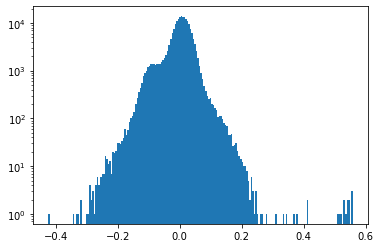

In [64]:
%matplotlib inline
plt.hist(signal_to_use_1-PWC_signal_1, bins=200)
plt.gca().set_yscale("log")
plt.show()

In [38]:
delta_est=0.1; sensitivity=100;
%matplotlib qt
nsac_07_09.change_cusum_func("CUSUM_own_opt")
t,signal_to_use,PWC_signal,std_val=nsac_07_09.apply_cusum(delta_est,sensitivity,whole_trace=False,plot=True,detrend=False);
std_val

0.04256895939093193

In [39]:
plt.plot(signal_to_use_1)
plt.plot(PWC_signal_1)
plt.plot(PWC_signal)
plt.show()

Notice that std for this devices went higher when voltage activated. One could assume that this is due to inherent noise of the devices and these affect only the first gaussian, So one could estimate it on the fly assuming that the heavy tail remains the same. 

## Dev 45

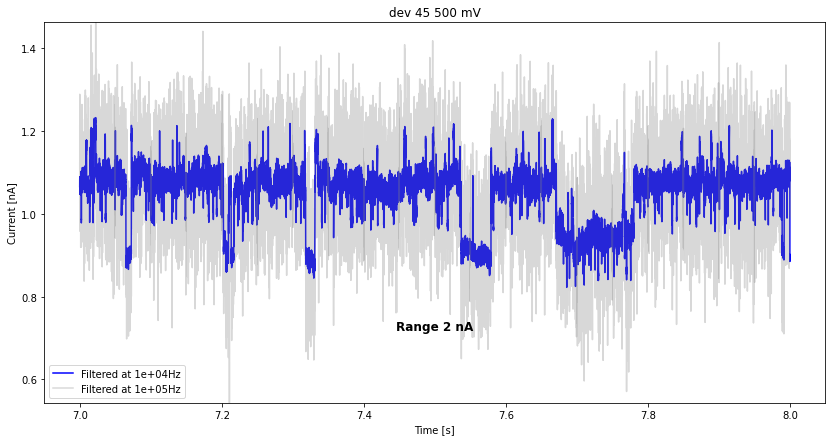

In [48]:
nsac_07_09.set_dev_and_voltage(45,500)
%matplotlib inline
nsac_07_09.set_test_sub_signal(7,8);

C:/Users/JK-WORK/Documents/MST/Event-analysis/Data analysis/Useful_funcs_and_classes\Hist_with_fits.py:35: RuntimeWarning: divide by zero encountered in log10
  y=np.log10(n);


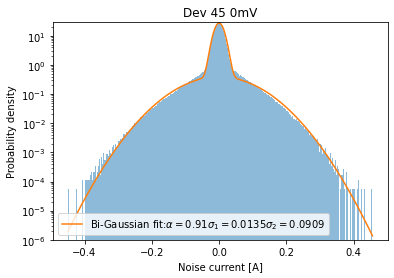

Total std @0mV: 0.029526


In [49]:
%matplotlib inline
snoa0709=Nanoelectrode_noise_analyzer(db_07_09)
alpha,std,std2=snoa0709.plot_hist(45,voltage=0,fit="Bigaussian_log",title="Dev 45 0mV",bins=300,normalized=False)
params=(std, std2, alpha);
print("Total std @0mV: " + str(db_07_09.get_pulse_information_dev(45,'std',0)))

In [50]:
delta_est=0.08; sensitivity=20;
%matplotlib qt
nsac_07_09.change_cusum_func("CUSUM_own_opt")
t,signal_to_use,PWC_signal_1,std_val=nsac_07_09.apply_cusum(delta_est,sensitivity,whole_trace=False,plot=True,detrend=False);
std_val

0.04146259400091229

In [51]:
delta_est=0.08; sensitivity=50;
%matplotlib qt
nsac_07_09.change_cusum_func("PWG")
t,signal_to_use,PWC_signal,std_val=nsac_07_09.apply_cusum(delta_est,sensitivity,params=params,whole_trace=False,plot=True,detrend=False);
std_val

0.04112420598882988

In [ ]:
In this case std also grows.

In [53]:
plt.plot(signal_to_use)
plt.plot(PWC_signal_1)
plt.plot(PWC_signal)
plt.show()

# Working with synthetic data

In [2]:
from funcs_for_notebook import generate_synthetic_data,run_cusum,compute_results,plot_LLR_opt,simple_run_test,loop_config_through_hs,plot_loop_config_through_hs_output
length=int(10e3);
SNRs=[0.5,1,2,5,10]

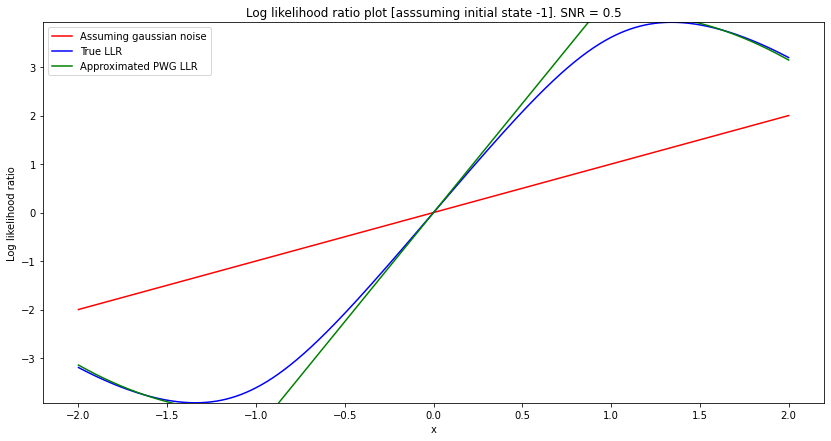

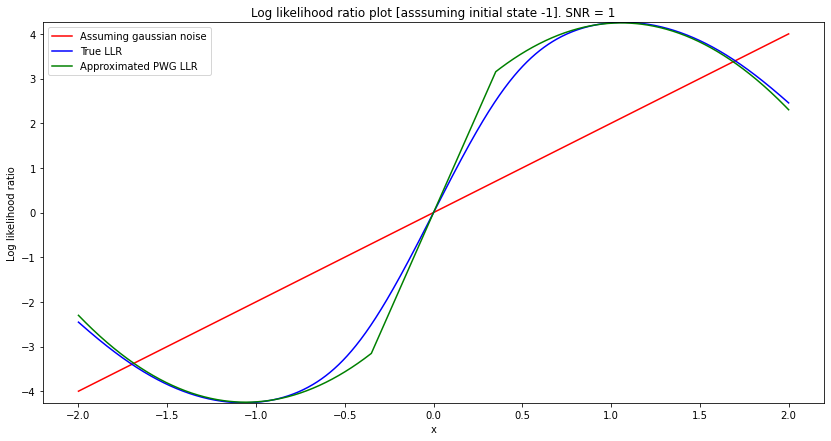

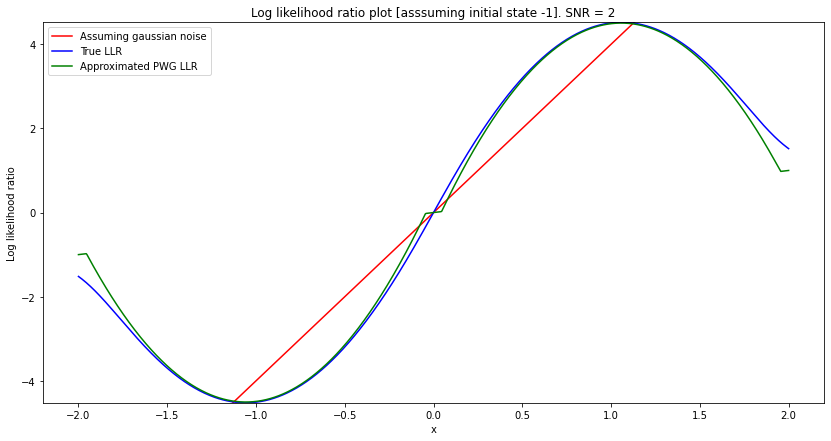

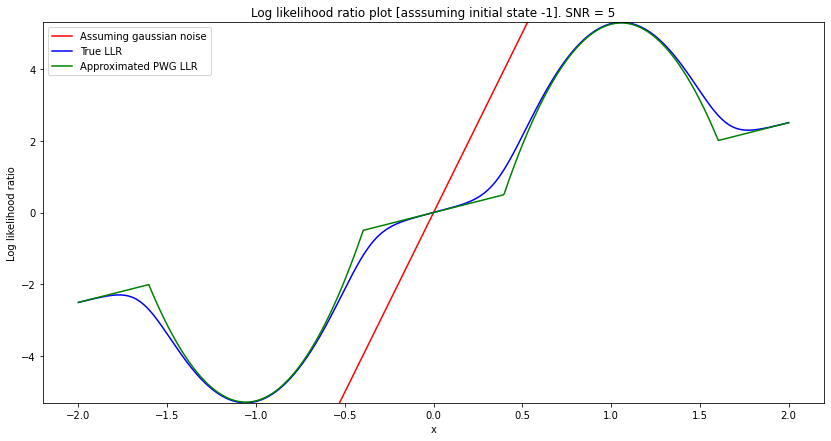

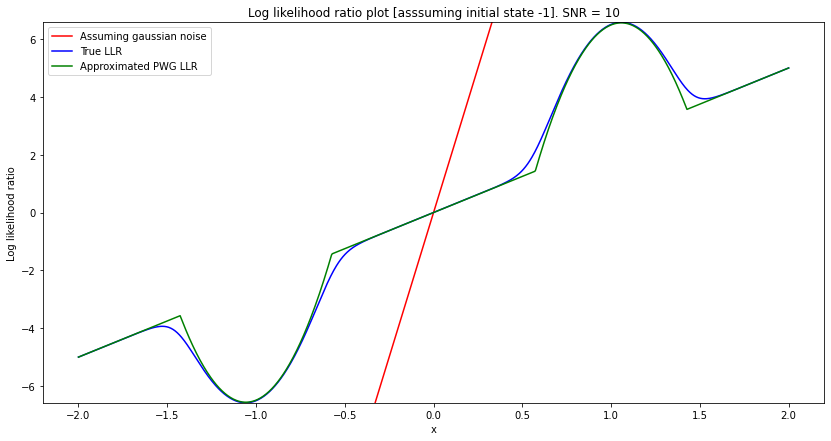

In [2]:
for SNR in SNRs:
    t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
    plot_LLR_opt(std,std2,alpha,title="Log likelihood ratio plot [asssuming initial state -1]. SNR = "+str(SNR))

### Some initial tries

In [13]:

length=int(200e3);# would be 1 second long
SNR=5;pdf_type="PWG";
hs=np.linspace(2,100,num=30)
n_runs=3;
out_mses_g=[];out_mses_pwg=[];out_pscs_g=[];out_pscs_pwg=[]
for h in hs:
    mses_g=[];mses_pwg=[]
    pscs_g=[];pscs_pwg=[]
    for i in range(n_runs):
        t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
        cusum_output_pwg=run_cusum(h,cont_signal,"PWG",alpha,std,std2,delta=2,opt=True)
        cusum_output_g=run_cusum(h,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
        total_MSE_g,_,per_sample_clasification_score_g,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_g)
        total_MSE_pwg,_,per_sample_clasification_score_pwg,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_pwg)
        mses_g.append(total_MSE_g);mses_pwg.append(total_MSE_pwg);
        pscs_g.append(per_sample_clasification_score_g);pscs_pwg.append(per_sample_clasification_score_pwg);
    out_mses_g.append(np.mean(mses_g));out_mses_pwg.append(np.mean(mses_pwg));
    out_pscs_g.append(np.mean(pscs_g));out_pscs_pwg.append(np.mean(pscs_pwg))

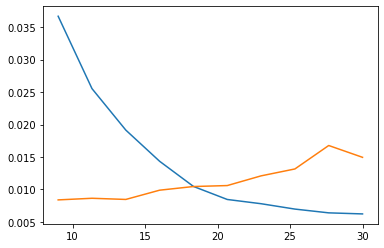

In [9]:
plt.plot(hs,out_mses_g)
plt.plot(hs,out_mses_pwg)
plt.show()

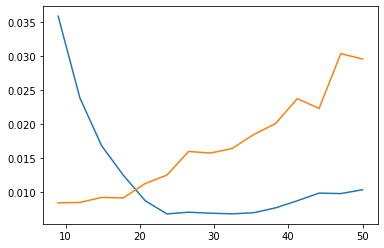

In [11]:
plt.plot(hs,out_mses_g)
plt.plot(hs,out_mses_pwg)
plt.show()

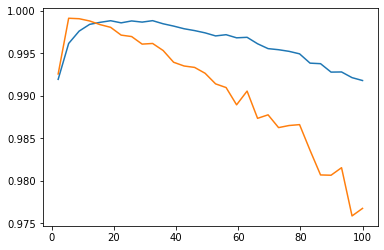

In [14]:
plt.plot(hs,out_pscs_g)
plt.plot(hs,out_pscs_pwg)
plt.show()

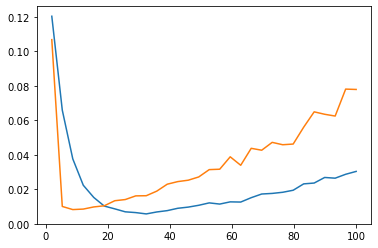

In [15]:
plt.plot(hs,out_mses_g)
plt.plot(hs,out_mses_pwg)
plt.show()

#### MSE for different SNRs and h values

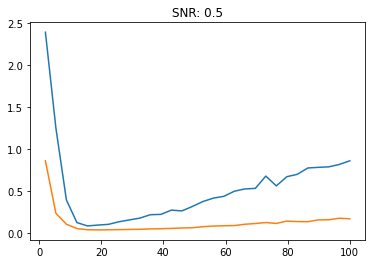

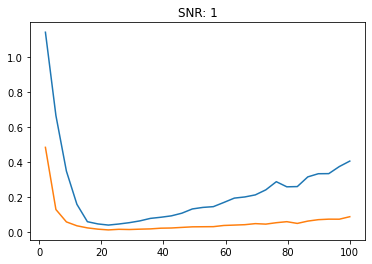

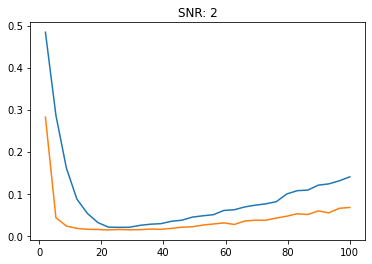

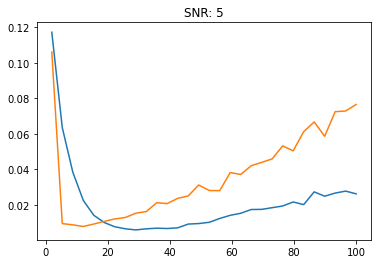

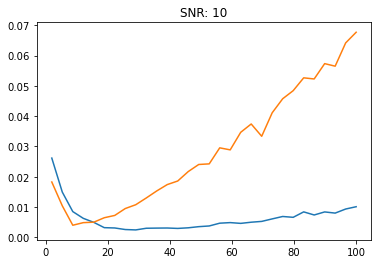

In [16]:
length=int(200e3);# would be 1 second long
pdf_type="PWG";
hs=np.linspace(2,100,num=30)
n_runs=3;
SNRs=[0.5,1,2,5,10]

for SNR in SNRs:
    out_mses_g=[];out_mses_pwg=[];out_pscs_g=[];out_pscs_pwg=[]
    for h in hs:
        mses_g=[];mses_pwg=[]
        pscs_g=[];pscs_pwg=[]
        for i in range(n_runs):
            t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
            cusum_output_pwg=run_cusum(h,cont_signal,"PWG",alpha,std,std2,delta=2,opt=True)
            cusum_output_g=run_cusum(h,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
            total_MSE_g,_,per_sample_clasification_score_g,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_g)
            total_MSE_pwg,_,per_sample_clasification_score_pwg,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_pwg)
            mses_g.append(total_MSE_g);mses_pwg.append(total_MSE_pwg);
            pscs_g.append(per_sample_clasification_score_g);pscs_pwg.append(per_sample_clasification_score_pwg);
        out_mses_g.append(np.mean(mses_g));out_mses_pwg.append(np.mean(mses_pwg));
        out_pscs_g.append(np.mean(pscs_g));out_pscs_pwg.append(np.mean(pscs_pwg))
    plt.plot(hs,out_mses_g)
    plt.plot(hs,out_mses_pwg)
    plt.title("SNR: "+ str(SNR))
    plt.show()

For low SNR one can see  that the upgraded cusum has always less MSE, but in the case of higher SNR the other cusum has lower error with much higher H. Lets do something more formal plotting all the variables

### This here were some codes to confirm the the normal cusum had lower MSE

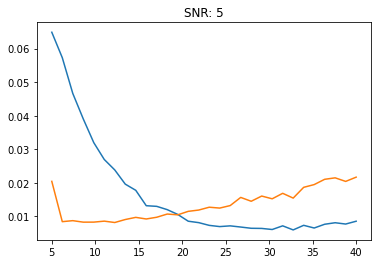

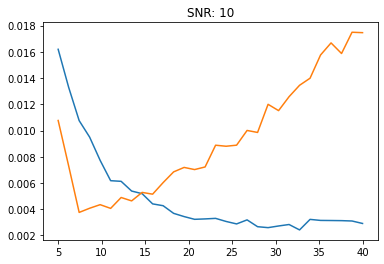

In [17]:
length=int(200e3);# would be 1 second long
pdf_type="PWG";
hs=np.linspace(5,40,num=30)
n_runs=3;
SNRs=[5,10]

for SNR in SNRs:
    out_mses_g=[];out_mses_pwg=[];out_pscs_g=[];out_pscs_pwg=[]
    for h in hs:
        mses_g=[];mses_pwg=[]
        pscs_g=[];pscs_pwg=[]
        for i in range(n_runs):
            t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
            cusum_output_pwg=run_cusum(h,cont_signal,"PWG",alpha,std,std2,delta=2,opt=True)
            cusum_output_g=run_cusum(h,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
            total_MSE_g,_,per_sample_clasification_score_g,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_g)
            total_MSE_pwg,_,per_sample_clasification_score_pwg,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_pwg)
            mses_g.append(total_MSE_g);mses_pwg.append(total_MSE_pwg);
            pscs_g.append(per_sample_clasification_score_g);pscs_pwg.append(per_sample_clasification_score_pwg);
        out_mses_g.append(np.mean(mses_g));out_mses_pwg.append(np.mean(mses_pwg));
        out_pscs_g.append(np.mean(pscs_g));out_pscs_pwg.append(np.mean(pscs_pwg))
    plt.plot(hs,out_mses_g)
    plt.plot(hs,out_mses_pwg)
    plt.title("SNR: "+ str(SNR))
    plt.show()

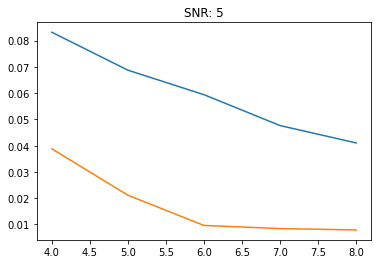

In [18]:
length=int(200e3);# would be 1 second long
pdf_type="PWG";
hs=np.linspace(4,8,num=5)
n_runs=3;
SNRs=[5]

for SNR in SNRs:
    out_mses_g=[];out_mses_pwg=[];out_pscs_g=[];out_pscs_pwg=[]
    for h in hs:
        mses_g=[];mses_pwg=[]
        pscs_g=[];pscs_pwg=[]
        for i in range(n_runs):
            t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
            cusum_output_pwg=run_cusum(h,cont_signal,"PWG",alpha,std,std2,delta=2,opt=True)
            cusum_output_g=run_cusum(h,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
            total_MSE_g,_,per_sample_clasification_score_g,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_g)
            total_MSE_pwg,_,per_sample_clasification_score_pwg,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_pwg)
            mses_g.append(total_MSE_g);mses_pwg.append(total_MSE_pwg);
            pscs_g.append(per_sample_clasification_score_g);pscs_pwg.append(per_sample_clasification_score_pwg);
        out_mses_g.append(np.mean(mses_g));out_mses_pwg.append(np.mean(mses_pwg));
        out_pscs_g.append(np.mean(pscs_g));out_pscs_pwg.append(np.mean(pscs_pwg))
    plt.plot(hs,out_mses_g)
    plt.plot(hs,out_mses_pwg)
    plt.title("SNR: "+ str(SNR))
    plt.show()

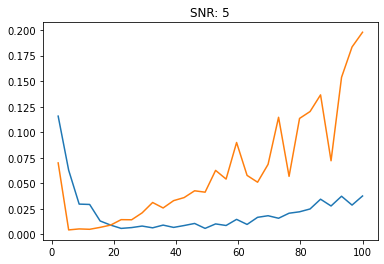

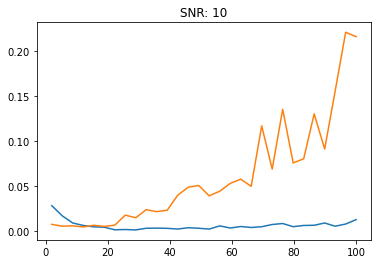

In [23]:
%matplotlib inline
length=int(20e3);# would be 1 second long
pdf_type="PWG";
hs=np.linspace(2,100,num=30)
n_runs=3;
SNRs=[5,10]

for SNR in SNRs:
    out_mses_g=[];out_mses_pwg=[];out_pscs_g=[];out_pscs_pwg=[]
    for h in hs:
        mses_g=[];mses_pwg=[]
        pscs_g=[];pscs_pwg=[]
        for i in range(n_runs):
            t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
            cusum_output_pwg=run_cusum(h,cont_signal,"Bigaussian",alpha,std,std2,delta=2,opt=True)
            cusum_output_g=run_cusum(h,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
            total_MSE_g,_,per_sample_clasification_score_g,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_g)
            total_MSE_pwg,_,per_sample_clasification_score_pwg,_=compute_results(true_signal,d_list,states,cont_signal,cusum_output_pwg)
            mses_g.append(total_MSE_g);mses_pwg.append(total_MSE_pwg);
            pscs_g.append(per_sample_clasification_score_g);pscs_pwg.append(per_sample_clasification_score_pwg);
        out_mses_g.append(np.mean(mses_g));out_mses_pwg.append(np.mean(mses_pwg));
        out_pscs_g.append(np.mean(pscs_g));out_pscs_pwg.append(np.mean(pscs_pwg))
    plt.plot(hs,out_mses_g)
    plt.plot(hs,out_mses_pwg)
    plt.title("SNR: "+ str(SNR))
    plt.show()

In [26]:
%matplotlib qt
length=int(20e3);
SNR=5
t,true_signal,cont_signal,d_list,states,std,std2,alpha=generate_synthetic_data(length,SNR)
cusum_output_pwg=run_cusum(30,cont_signal,"Bigaussian",alpha,std,std2,delta=2,opt=True)
cusum_output_g=run_cusum(30,cont_signal,"Gaussian",alpha,std,std2,delta=2,opt=True)
plt.figure()
plt.plot(t,true_signal,label="True signal")
plt.plot(t,cont_signal,label="Contaminated signal",alpha=0.2)
plt.plot(t,cusum_output_g,label="CUSUM out best gaussian")
plt.plot(t,cusum_output_pwg,label="CUSUM out best PWG",linestyle='--')
plt.legend()
plt.show()

### More structured code to evaluate this statistics

In [3]:
from funcs_for_notebook import loop_config_through_hs,plot_loop_config_through_hs_output,analyze_configuration_v2,estimate_h_range_for_all_types_v2

SNRs=[0.5,1,2,5,10]
hs=np.linspace(1,50,num=15)
length=int(100e3);
n_runs=3;

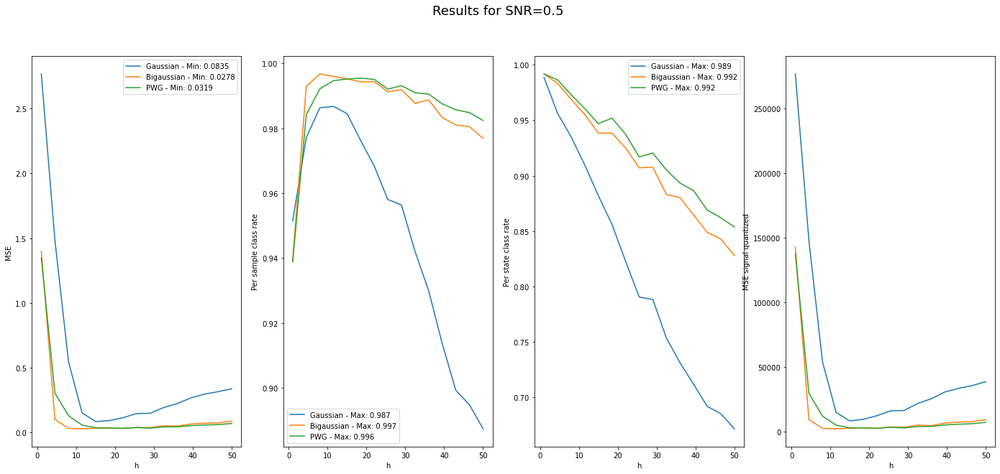

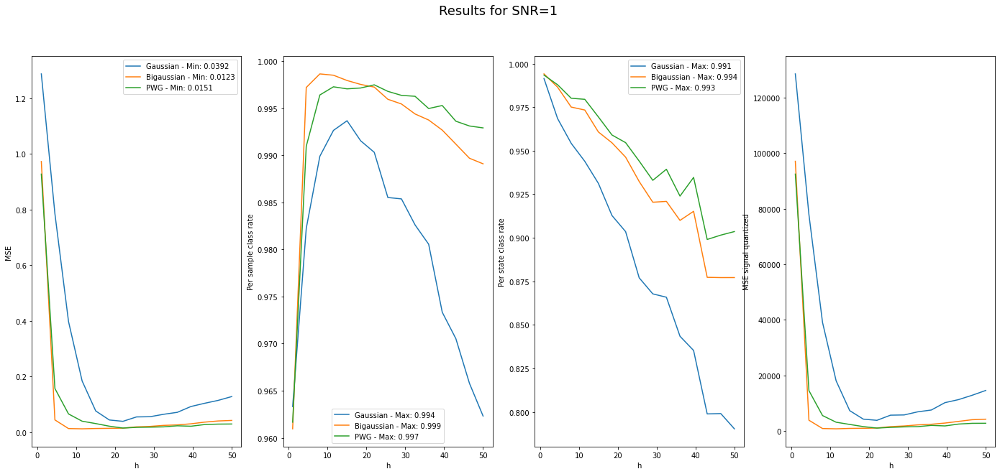

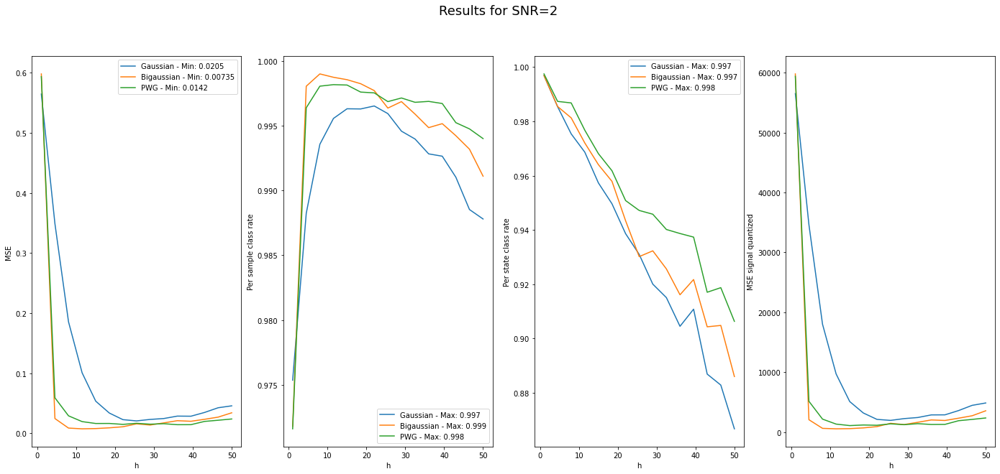

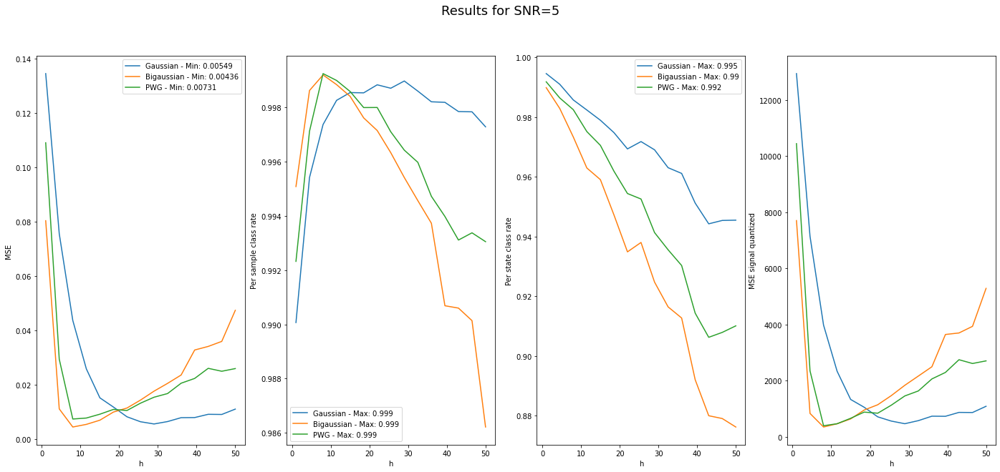

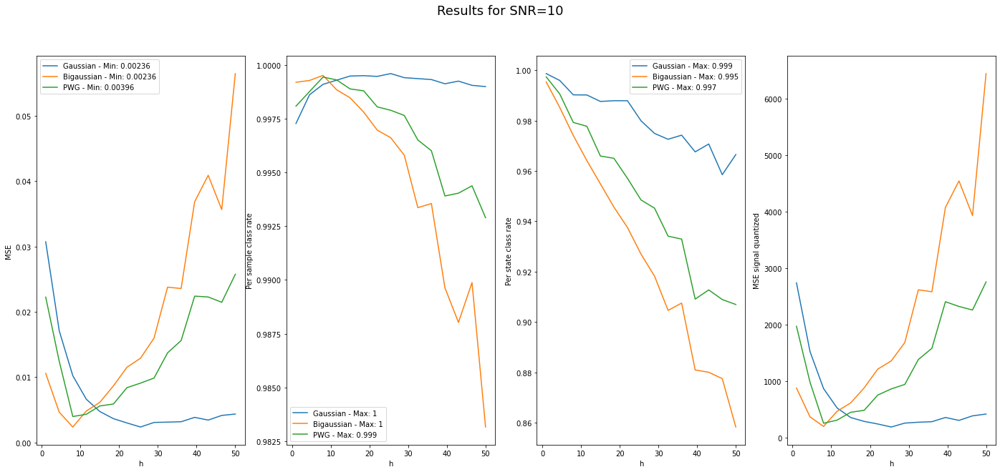

In [8]:
for SNR in SNRs:
    output_results,pdf_types=loop_config_through_hs(hs,SNR,n_runs=n_runs,length=length)
    plot_loop_config_through_hs_output(hs,SNR,pdf_types,output_results)

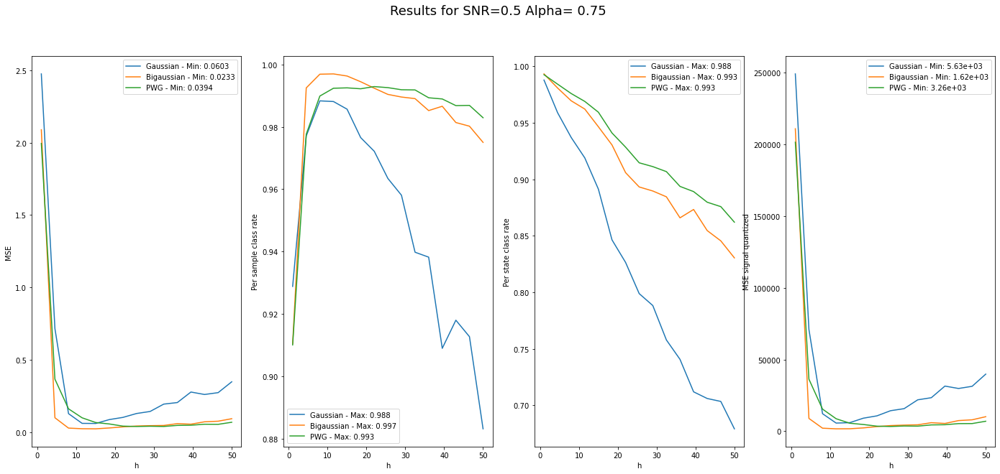

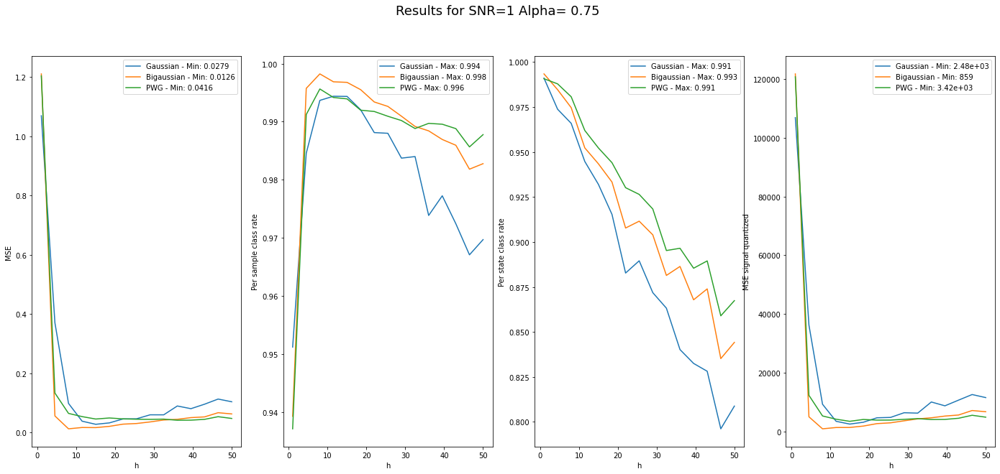

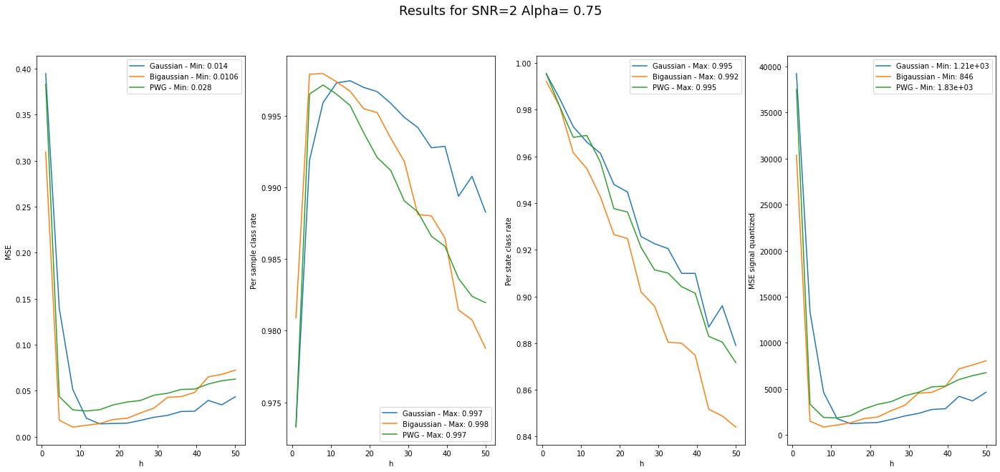

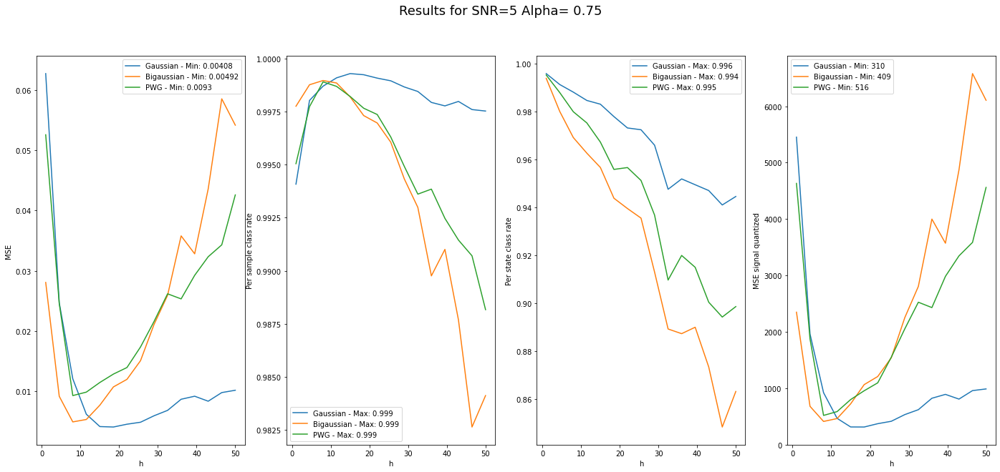

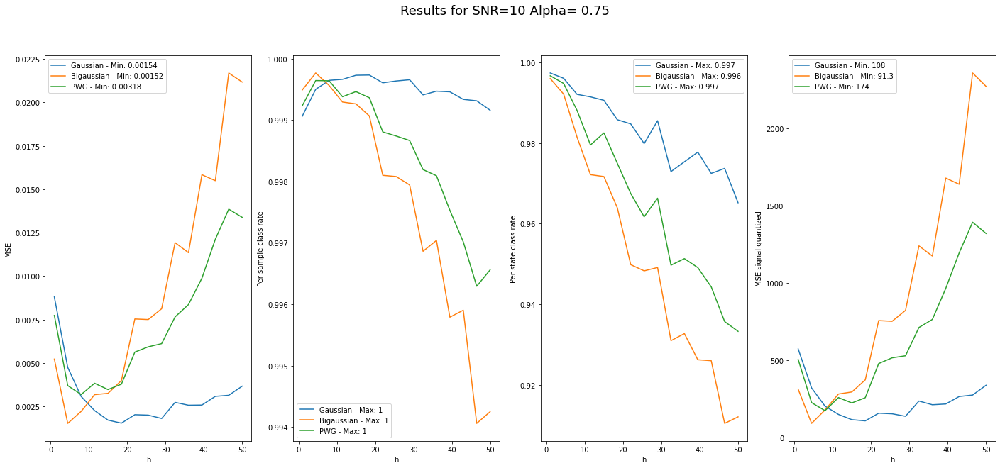

In [10]:
alpha=0.75
for SNR in SNRs:
    output_results,pdf_types=loop_config_through_hs(hs,SNR,alpha=alpha,n_runs=n_runs,length=length)
    plot_loop_config_through_hs_output(hs,SNR,pdf_types,output_results,title="Results for SNR="+"{:.3g}".format(SNR)+ " Alpha= " + "{:.3g}".format(alpha))

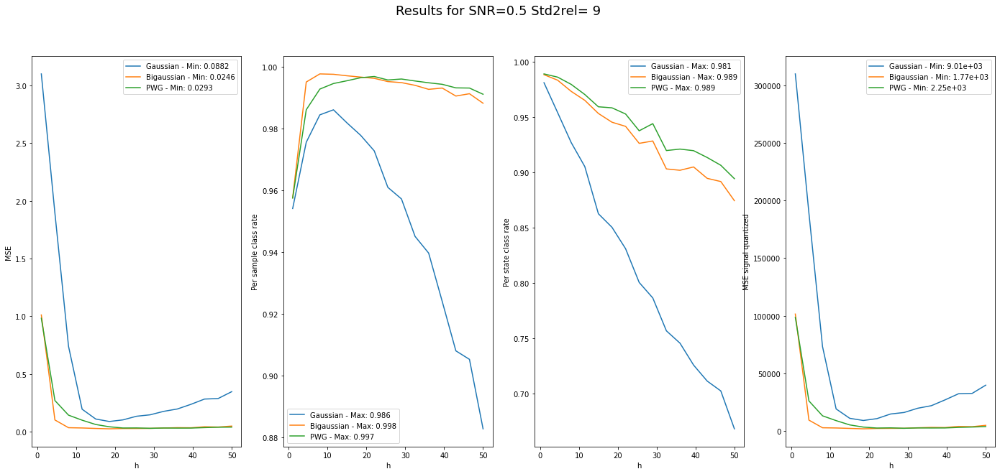

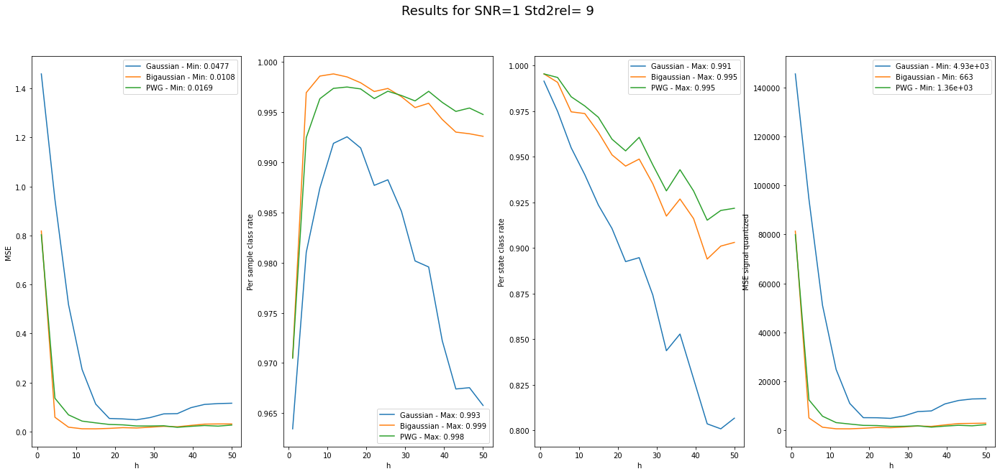

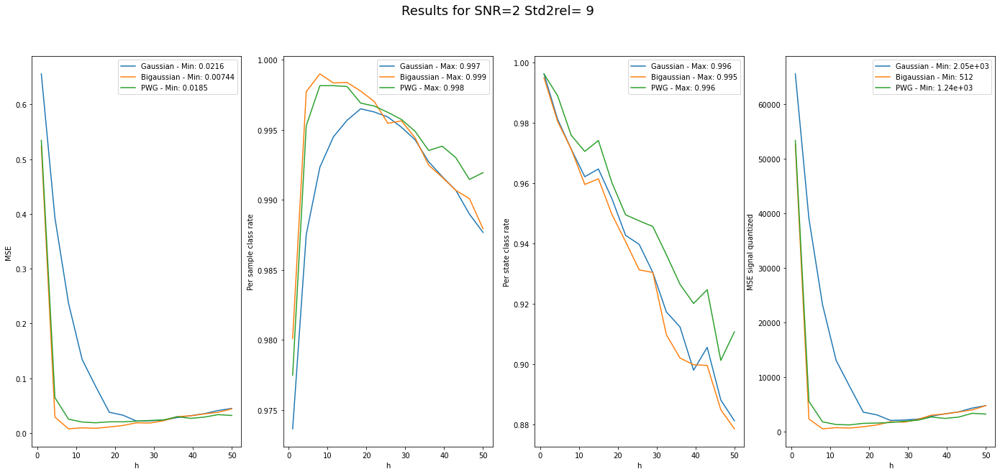

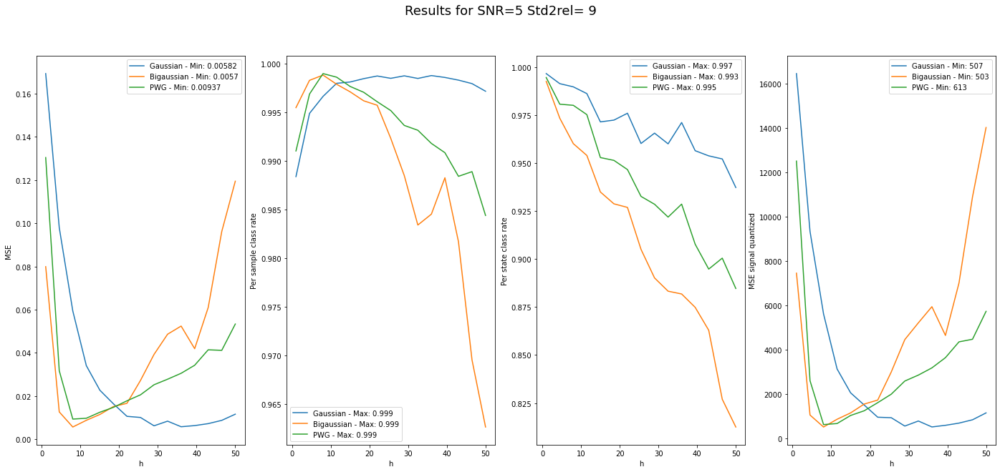

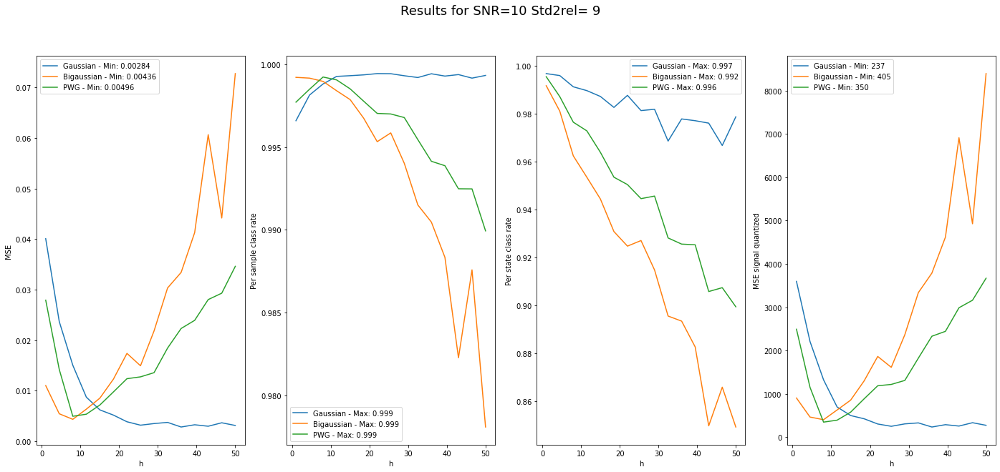

In [12]:
std2_rel=9
for SNR in SNRs:
    output_results,pdf_types=loop_config_through_hs(hs,SNR,std2_rel=std2_rel,n_runs=n_runs,length=length)
    plot_loop_config_through_hs_output(hs,SNR,pdf_types,output_results,title="Results for SNR="+"{:.3g}".format(SNR)+ " Std2rel= " + "{:.3g}".format(std2_rel))

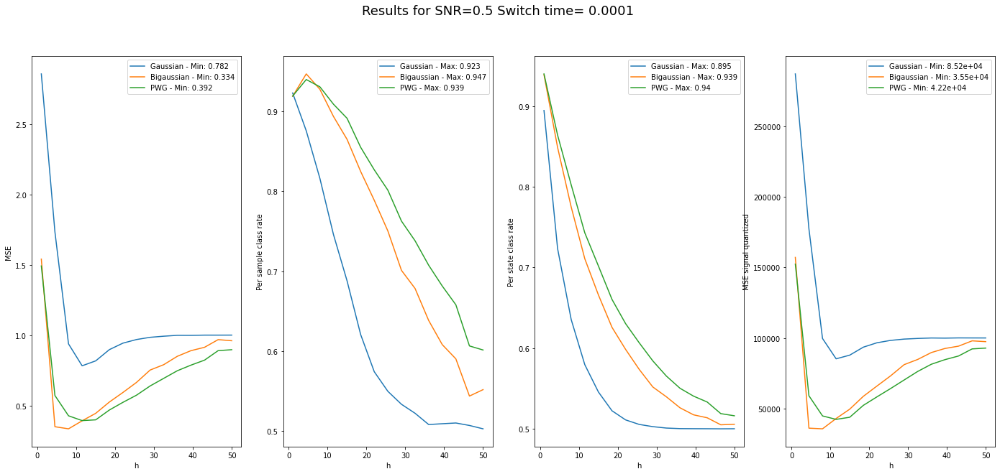

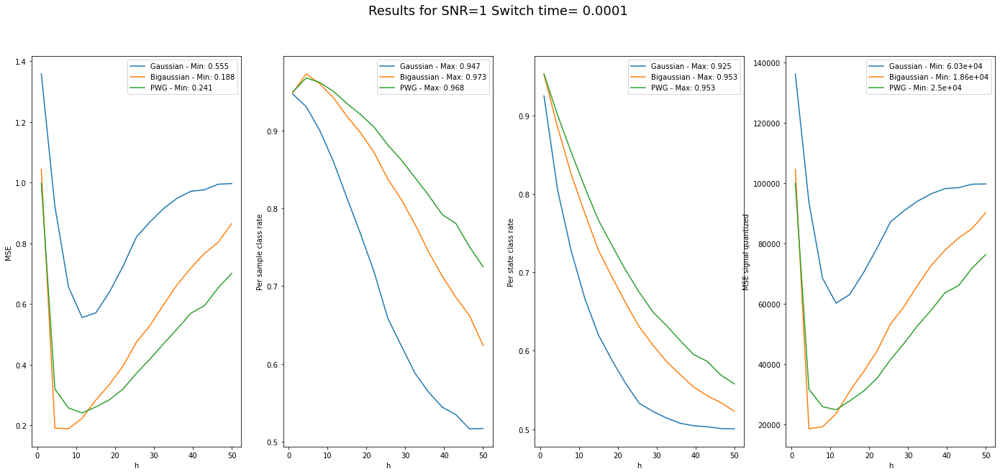

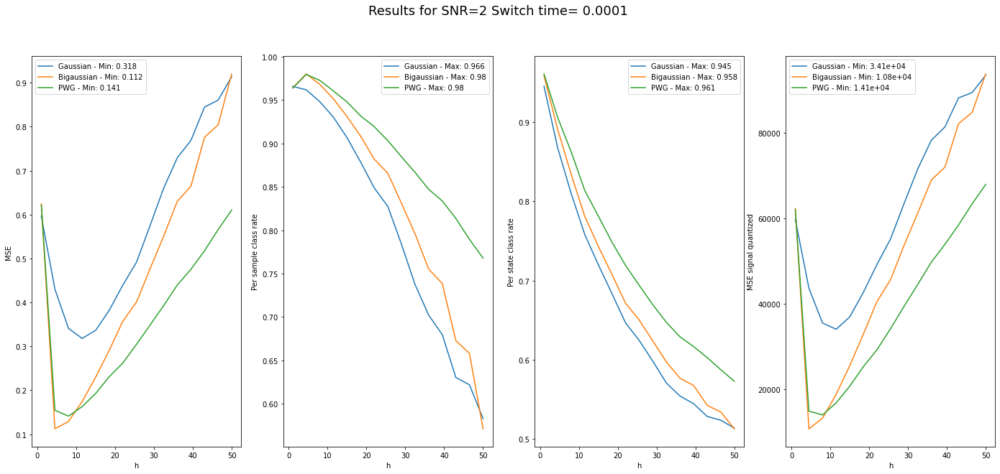

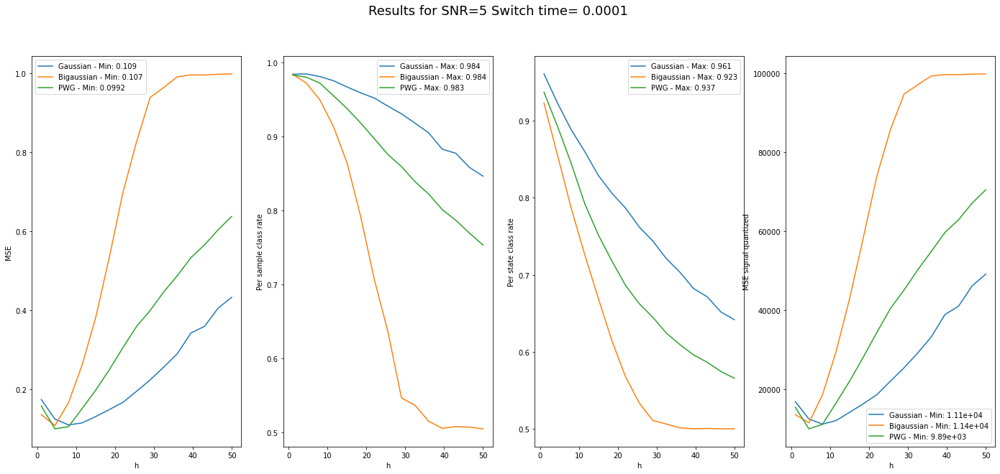

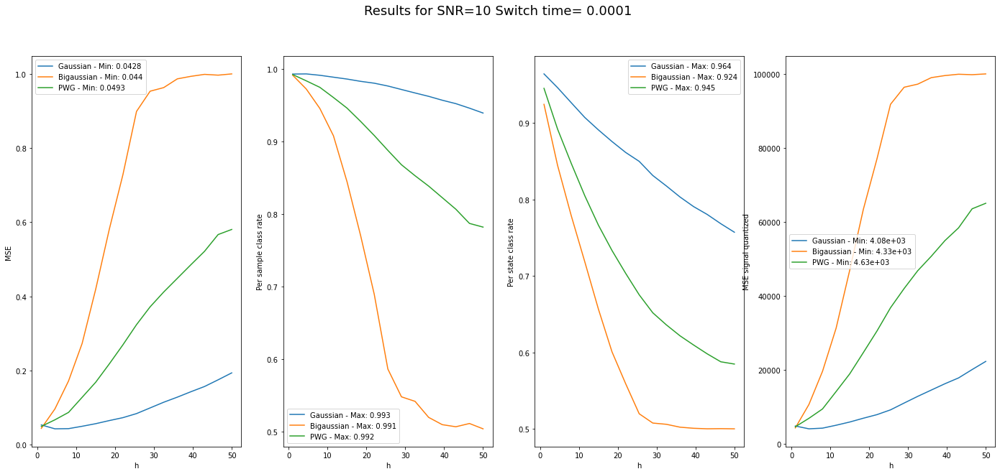

In [13]:
expected_switching_time=1e-4;
for SNR in SNRs:
    output_results,pdf_types=loop_config_through_hs(hs,SNR,expected_switching_time=expected_switching_time,n_runs=n_runs,length=length)
    plot_loop_config_through_hs_output(hs,SNR,pdf_types,output_results,title="Results for SNR="+"{:.3g}".format(SNR)+ " Switch time= " + "{:.3g}".format(expected_switching_time))

In [7]:
%matplotlib qt
from funcs_for_notebook import simple_run_test

simple_run_test([20,20,20])


In [7]:
simple_run_test([30,8,9],SNR=10)

Seems that at high SNR all pdf types are able to catch the same jumps (the ones that are not extremely short) But the pwg varies a lot in the middle. What if we take the error by taking the MSE against the signal quantized in integer numbers?

In [18]:
simple_run_test([30,10,10],SNR=10,std2_rel=9)

In [7]:
%matplotlib qt
simple_run_test([30,10,10],SNR=1)
simple_run_test([30,10,10],SNR=10)

My final guess is that here we are using very high SNRs and there it seems that it behaves different to the curves we have. So I will repeat the same curves with other SNRs.
# Plots for the paper

# ARL0 Vs ARL1 curves

Fijo SNR maximo (a maximo delta). Vario alpha, stdrel. Fijar Nmin para que sea lo otro. Delta deberia dejarlo en 2 y cambiar std1 asi tengo el SNR .

In [2]:
target_ARL0_range=[50,1000]
SNR=1;alpha=0.9;std2_rel=6;
a,b,c=estimate_h_range_for_all_types_v2(SNR,alpha,std2_rel,target_ARL0_range)

Base ARL0 found for bigaussian is :75.4040404040404 with H= 3.513840000000001
Hs range for bigaussian are: 2.7492524039828314 - 7.215539076787367. R2 val is: 0.998146667598481
Base ARL0 found for gaussian is :101.33928571428571 with H= 5.196059275440003
Hs range for Gaussian are: 3.282934942363607 - 11.531975953627768. R2 val is: 0.9951977013079268


### Check code with short range of parameters

In [2]:
SNRs=[0.5, 1, 2];
alphas=[0.6,0.9];
std2_rels=[3,9];
target_ARL0_range=[50,500]

In [9]:
res_table=pd.DataFrame(columns = ['SNR','alpha','std2_rel','h_min_big','h_max_big','h_min_pwg','h_max_pwg','h_min_g','h_max_g']) 
index=0;
for SNR in SNRs:
    for alpha in alphas:
        for std2_rel in std2_rels:
            print(index)
            h_lims_gauss, h_lims_bigauss, h_lims_pwg  = estimate_h_range_for_all_types_v2(SNR,alpha,std2_rel,target_ARL0_range)
            res_table.loc[index]=[SNR,alpha,std2_rel,h_lims_bigauss[0],h_lims_bigauss[1],h_lims_pwg[0],h_lims_pwg[1],h_lims_gauss[0],h_lims_gauss[1]]
            index+=1;        
res_table.to_csv("Hlims for curves vshort.csv") 

0
1
2
3
4
5
6
7
8
9
10
11


In [10]:
res_table

,SNR,alpha,std2_rel,h_min_big,h_max_big,h_min_pwg,h_max_pwg,h_min_g,h_max_g
0,0.5,0.6,3.0,2.281312,5.276814,2.623509,5.276814,2.623509,6.068337
1,0.5,0.6,9.0,3.017036,5.276814,3.017036,4.588534,3.017036,6.068337
2,0.5,0.9,3.0,3.017036,5.276814,3.469591,6.068337,2.623509,6.978587
3,0.5,0.9,9.0,1.983750,4.588534,1.983750,4.588534,3.469591,9.229181
4,1.0,0.6,3.0,3.017036,5.276814,2.623509,5.276814,3.469591,6.978587
5,1.0,0.6,9.0,3.469591,5.276814,3.469591,5.276814,3.469591,8.025375
6,1.0,0.9,3.0,3.469591,5.276814,3.469591,5.276814,2.623509,8.025375
7,1.0,0.9,9.0,1.725000,5.276814,1.725000,5.276814,4.588534,12.205592
8,2.0,0.6,3.0,2.623509,4.588534,2.623509,3.990030,3.017036,6.978587
9,2.0,0.6,9.0,2.623509,4.588534,2.623509,4.588534,3.990030,9.229181


In [14]:
df = pd.read_csv ('Hlims for curves vshort.csv') 
noise_len=1e6;
tol=0.01;
n=5;
total_len=len(df)*n
out_table=pd.DataFrame(columns = ['SNR','alpha','std2_rel','pdf_type','h','ARL0','ARL1','CompTime']) 
pdf_types=["Gaussian","Bigaussian","PWG"];
out_table_idx=0;
def get_hs_for_pdf(row,pdf_types):
    if pdf_types=="Gaussian":
        hmin=row['h_min_g'];hmax=row['h_max_g'];
    elif pdf_types=="Bigaussian":
        hmin=row['h_min_big'];hmax=row['h_max_big'];
    elif pdf_types=="PWG":
        hmin=row['h_min_pwg'];hmax=row['h_max_pwg'];
    return hmin,hmax;
for index, row in df.iterrows():
    for pdf_type in pdf_types:
        hmin,hmax=get_hs_for_pdf(row,pdf_type)
        hs=np.linspace(hmin,hmax,num=n)
        SNR=row['SNR'];alpha=row['alpha'];std2_rel=row['std2_rel'];
        for h in hs:
            ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration_v2(h,SNR,alpha,std2_rel,pdf_type=pdf_type,base_len=noise_len, tol=tol, minN=10)
            print(str(out_table_idx) + "/"+str(3*total_len)+ ": "+" h="+str(h)+ " SNR="+str(SNR)+" alpha="+str(alpha)+" std2rel="+str(std2_rel)+ " pdf= "+ pdf_type+  " - ARL0:" + str(ARL0_mean_est) + " ARL:1 " + str(ARL1_mean_est));
            out_table.loc[out_table_idx]=[row['SNR'],row['alpha'],row['std2_rel'],pdf_type,h,ARL0_mean_est,ARL1_mean_est,ARL0_comp_time]
            out_table_idx+=1;
out_table.to_csv("ARL_Results_vshort.csv") 

0/180:  h=2.623509374999999 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Gaussian - ARL0:42.742574257425744 ARL:1 2.206896551724138
1/180:  h=3.484716182140464 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Gaussian - ARL0:94.17647058823529 ARL:1 2.977272727272727
2/180:  h=4.34592298928093 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Gaussian - ARL0:170.7127659574468 ARL:1 4.222222222222222
3/180:  h=5.207129796421395 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Gaussian - ARL0:412.08849557522126 ARL:1 4.770491803278689
4/180:  h=6.06833660356186 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Gaussian - ARL0:837.4351851851852 ARL:1 6.111111111111111
5/180:  h=2.2813124999999994 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Bigaussian - ARL0:45.97530864197531 ARL:1 1.7083333333333333
6/180:  h=3.0301879844699693 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Bigaussian - ARL0:83.86776859504133 ARL:1 2.0416666666666665
7/180:  h=3.7790634689399387 SNR=0.5 alpha=0.6 std2rel=3.0 pdf= Bigaussian - ARL0:145.31460674157304 ARL:1 2.5964912280701755
8/180:  h=4.5279389

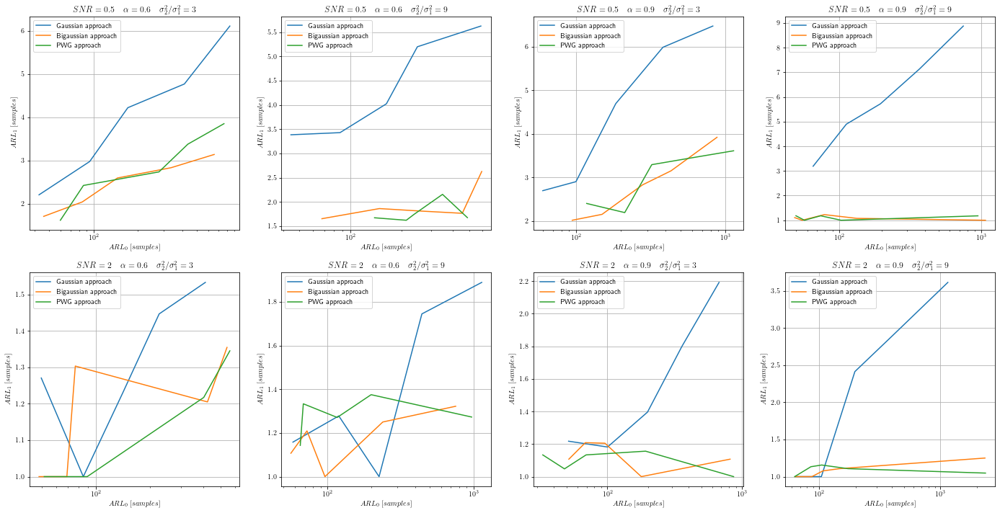

In [46]:
import matplotlib
matplotlib.rcParams['text.usetex'] = True

df = pd.read_csv ("ARL_Results_vshort.csv") 
SNRs=[0.5, 2]; #The values I use to plot
alphas=[0.6,0.9];
std2_rels=[3,9];
fig, axs = plt.subplots(2, 4, figsize=(24,12)) # 2x4 plots
idx=0;

for SNR in SNRs:
    for alpha in alphas:
        for std2_rel in std2_rels:
            data_sub_table= df[(df["alpha"] == alpha) & (df["SNR"] == SNR) & (df["std2_rel"] == std2_rel)]
            title= r'$SNR='+ "{:.3g}".format(SNR) + r'\quad \alpha=' + "{:.3g}".format(alpha) + r' \quad \sigma^2_2 / \sigma^2_1='+ "{:.3g}".format(std2_rel)  + r'$';
            plot_ARL1_vs_ARL0_in_axes(axs[int(idx/4),idx%4],data_sub_table,title=title)
            idx+=1;


### Final run

In [4]:
SNRs=[0.3, 0.5, 1, 2, 5, 10];
alphas=[0.6,0.7,0.8,0.9];
std2_rels=[3,6,9];
target_ARL0_range=[50,1000]

In [13]:
res_table=pd.DataFrame(columns = ['SNR','alpha','std2_rel','h_min_big','h_max_big','h_min_pwg','h_max_pwg','h_min_g','h_max_g']) 
index=0;
for SNR in SNRs:
    for alpha in alphas:
        for std2_rel in std2_rels:
            h_lims_bigauss, h_lims_pwg, h_lims_gauss = estimate_h_range_for_all_types_v2(SNR,alpha,std2_rel,target_ARL0_range)
            res_table.loc[index]=[SNR,alpha,std2_rel,h_lims_bigauss[0],h_lims_bigauss[1],h_lims_pwg[0],h_lims_pwg[1],h_lims_gauss[0],h_lims_gauss[1]]
            index+=1;        
res_table.to_csv("Hlims for curves v2.csv") 

Base ARL0 found for bigaussian is :75.04901960784314 with H= 2.9040000000000004
Hs range for bigaussian are: 2.4859316864652556 - 5.892911321553615. R2 val is: 0.9950337123645844
Base ARL0 found for gaussian is :107.3076923076923 with H= 3.226344000000001
Hs range for Gaussian are: 2.5225671182371205 - 5.517199001982434. R2 val is: 0.9916034876340687
Base ARL0 found for bigaussian is :89.11428571428571 with H= 3.194400000000001
Hs range for bigaussian are: 2.606363218025557 - 5.6362447629980075. R2 val is: 0.9847163470368016
Base ARL0 found for gaussian is :117.58823529411765 with H= 3.5489784000000015
Hs range for Gaussian are: 2.435400735275668 - 5.909692776759659. R2 val is: 0.9877973828149734
Base ARL0 found for bigaussian is :114.48863636363636 with H= 3.194400000000001
Hs range for bigaussian are: 1.7283974990578987 - 7.011767205464487. R2 val is: 0.9922833593533754
Base ARL0 found for gaussian is :120.375 with H= 3.5489784000000015
Hs range for Gaussian are: 2.626680576068491 - 

In [16]:
df = pd.read_csv ('Hlims for curves v2.csv') 
noise_len=1e6;
tol=0.01;
n=10;
total_len=len(df)*n
out_table=pd.DataFrame(columns = ['SNR','alpha','std2_rel','pdf_type','h','ARL0','ARL1','CompTime']) 
pdf_types=["Gaussian","Bigaussian","PWG"];
out_table_idx=0;
def get_hs_for_pdf(row,pdf_types):
    if pdf_types=="Gaussian":
        hmin=row['h_min_g'];hmax=row['h_max_g'];
    elif pdf_types=="Bigaussian":
        hmin=row['h_min_big'];hmax=row['h_max_big'];
    elif pdf_types=="PWG":
        hmin=row['h_min_pwg'];hmax=row['h_max_pwg'];
    return hmin,hmax;
for index, row in df.iterrows():
    for pdf_type in pdf_types:
        hmin,hmax=get_hs_for_pdf(row,pdf_type)
        hs=np.linspace(hmin,hmax,num=n)
        for h in hs:
            print(str(out_table_idx) + "/"+str(total_len))
            ARL0_mean_est,ARL0_mean_std_est,ARL1_mean_est,ARL1_mean_std_est,ARL0_comp_time,ARL1_comp_time=analyze_configuration_v2(h,SNR,alpha,std2_rel,pdf_type=pdf_type,base_len=noise_len, tol=tol, minN=20)
            out_table.loc[out_table_idx]=[row['SNR'],row['alpha'],row['std2_rel'],pdf_type,h,ARL0_mean_est,ARL1_mean_est,ARL0_comp_time]
            out_table_idx+=1;
out_table.to_csv("ARL_Results_v2.csv") 

0/720
1/720
2/720
3/720
4/720
5/720
6/720
7/720
8/720
9/720
10/720
11/720
12/720
13/720
14/720
15/720
16/720
17/720
18/720
19/720
20/720
21/720
22/720
23/720
24/720
25/720
26/720
27/720
28/720
29/720
30/720
31/720
32/720
33/720
34/720
35/720
36/720
37/720
38/720
39/720
40/720
41/720
42/720
43/720
44/720
45/720
46/720
47/720
48/720
49/720
50/720
51/720
52/720
53/720
54/720
55/720
56/720
57/720
58/720
59/720
60/720
61/720
62/720
63/720
64/720
65/720
66/720
67/720
68/720
69/720
70/720
71/720
72/720
73/720
74/720
75/720
76/720
77/720
78/720
79/720
80/720
81/720
82/720
83/720
84/720
85/720
86/720
87/720
88/720
89/720
90/720
91/720
92/720
93/720
94/720
95/720
96/720
97/720
98/720
99/720
100/720
101/720
102/720
103/720
104/720
105/720
106/720
107/720
108/720
109/720
110/720
111/720
112/720
113/720
114/720
115/720
116/720
117/720
118/720
119/720
120/720
121/720
122/720
123/720
124/720
125/720
126/720
127/720
128/720
129/720
130/720
131/720
132/720
133/720
134/720
135/720
136/720
137/720
138/72

MemoryError: Unable to allocate 18.2 GiB for an array with shape (1000, 2440247) and data type float64

In [18]:
out_table

,SNR,alpha,std2_rel,pdf_type,h,ARL0,ARL1,CompTime
0,0.3,0.6,3.0,Gaussian,2.522567,75.520000,1.000000,0.000003
1,0.3,0.6,3.0,Gaussian,2.855304,99.439655,1.000000,0.000003
2,0.3,0.6,3.0,Gaussian,3.188041,89.066667,1.076923,0.000003
3,0.3,0.6,3.0,Gaussian,3.520778,85.211111,1.000000,0.000004
4,0.3,0.6,3.0,Gaussian,3.853515,78.336283,1.000000,0.000006
...,...,...,...,...,...,...,...,...
1434,2.0,0.9,9.0,PWG,6.538415,2264.186916,1.000000,0.000006
1435,2.0,0.9,9.0,PWG,7.807371,72723.846847,1.000000,0.000045
1436,2.0,0.9,9.0,PWG,9.076327,115187.891089,1.000000,0.000022
1437,2.0,0.9,9.0,PWG,10.345282,165341.051020,1.230769,0.000130


In [19]:
out_table.to_csv("ARL_Results_v2.csv") 

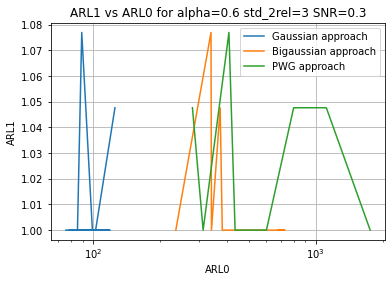

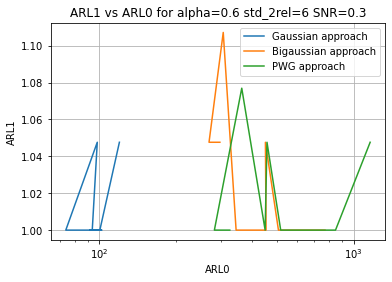

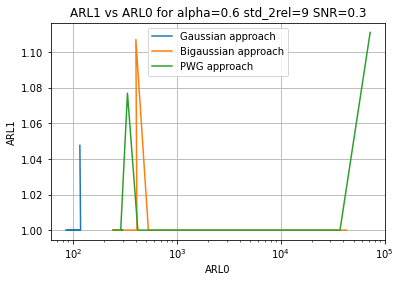

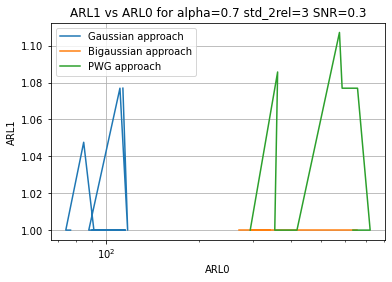

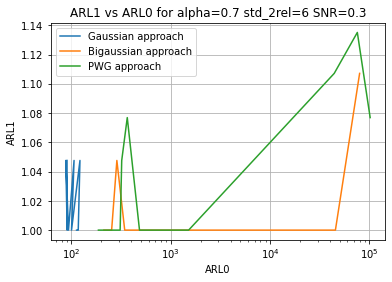

...

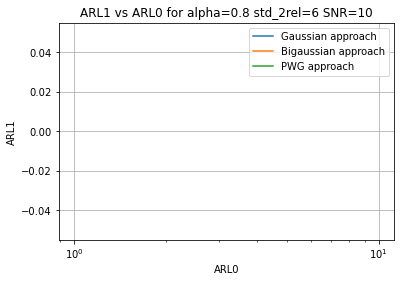

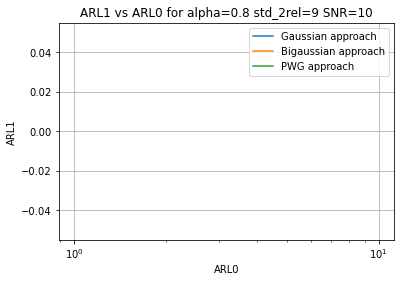

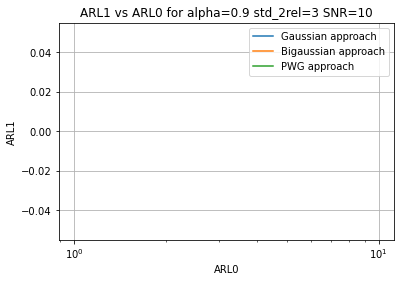

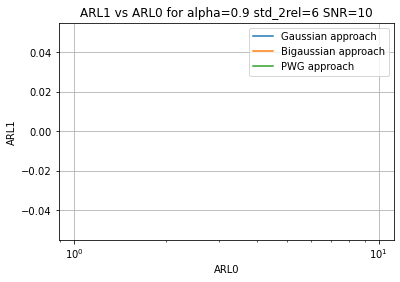

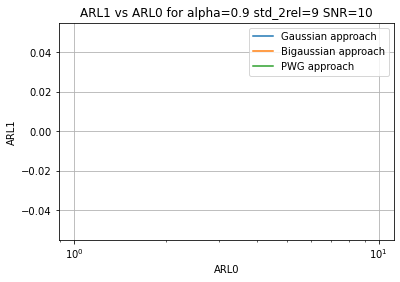

In [6]:
df = pd.read_csv ("ARL_Results_v2.csv") 
for SNR in SNRs:
    for alpha in alphas:
        for std2_rel in std2_rels:
            data_sub_table= df[(df["alpha"] == alpha) & (df["SNR"] == SNR) & (df["std2_rel"] == std2_rel)]
            title= "ARL1 vs ARL0 for alpha="+ "{:.3g}".format(alpha) + " std_2rel="+ "{:.3g}".format(std2_rel) + " SNR="+ "{:.3g}".format(SNR);
            plot_ARL1_vs_ARL0(data_sub_table,title=title)

Dev 17 -> SNR= (0.1/0.04)**2 
Dev 48 -> SNR= (0.08/0.04)**2 

In other devices this SNR should be lower since there is more noise.

# MSE curves

C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


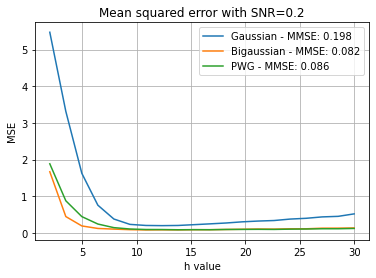

In [6]:
hs=np.linspace(2,30,num=20);
SNR=0.2
out,pdf_types=loop_config_through_hs_MSE_w_tol(hs,SNR,tol=0.05,length=int(200e3))
plot_loop_MSE(hs,SNR,pdf_types,out)

C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


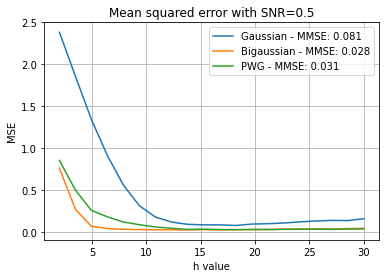

In [7]:
hs=np.linspace(2,30,num=20);
SNR=0.5
out,pdf_types=loop_config_through_hs_MSE_w_tol(hs,SNR,tol=0.05,length=int(200e3))
plot_loop_MSE(hs,SNR,pdf_types,out)

C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\JK-WORK\Anaconda3\envs\MSTDataAnalysis\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


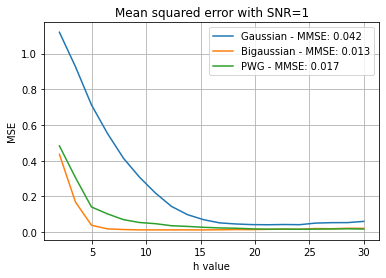

In [8]:
hs=np.linspace(2,30,num=20);
SNR=1
out,pdf_types=loop_config_through_hs_MSE_w_tol(hs,SNR,tol=0.05,length=int(200e3))
plot_loop_MSE(hs,SNR,pdf_types,out)